<a href="https://colab.research.google.com/github/mocodotempo/PrevisaodoTempo/blob/main/Previs%C3%A3oECMWF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install matplotlib cartopy cfgrib xarray eccodes pygrib --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.6/91.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.8/17.8 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 30.5 MB/s eta 0:00:00


Forecast: +180h
https://data.ecmwf.int/forecasts/20260817/00z/ifs/0p25/oper/20260817000000-180h-oper-fc.grib2


/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:200: RuntimeWarning: GDAL was built against curl 8.20.0, but is running against 7.61.1. Runtime failure is likely !
  return ogr_read(
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.12/dist-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com

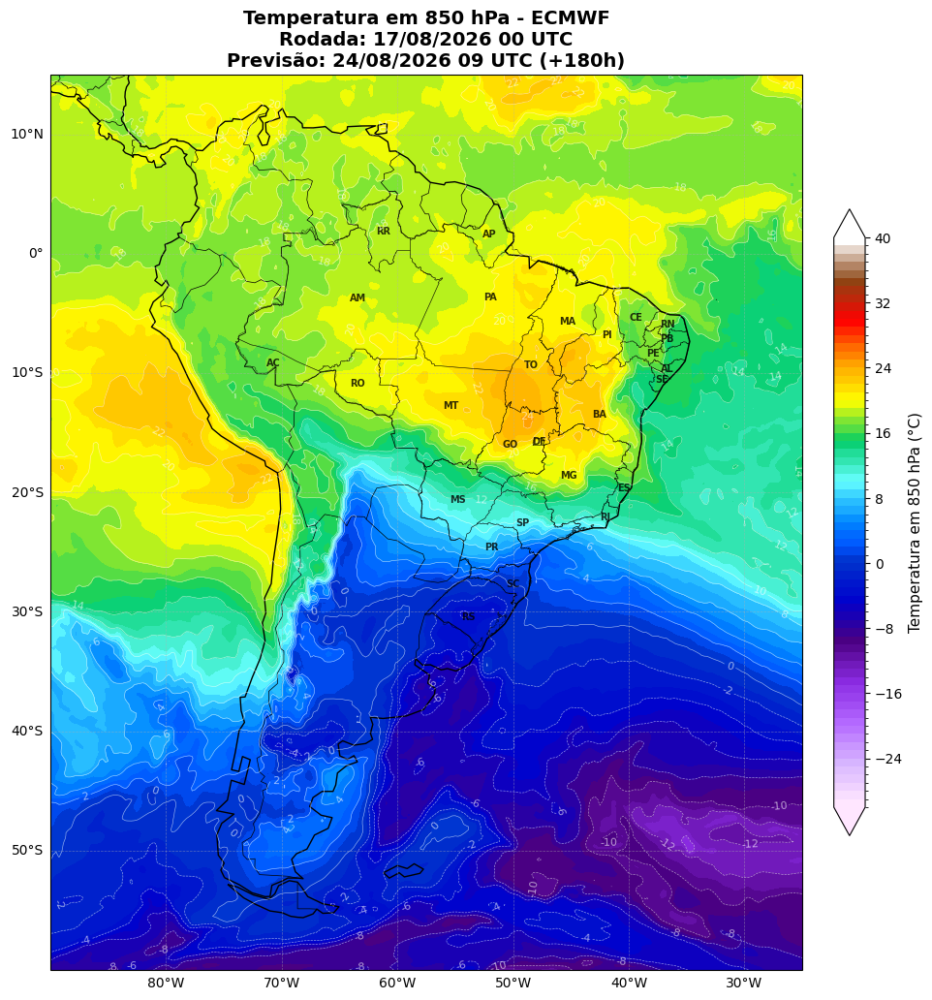

In [ ]:
# ============================================================
# ECMWF 850 hPa TEMPERATURA
# AMÉRICA DO SUL
# + DOWNLOAD ROBUSTO
# + ISOTERMAS
# + MAPA SINÓTICO
# ============================================================

import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from datetime import datetime
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import BoundaryNorm

# ============================================================
# CONFIGURAÇÕES
# ============================================================

data_rodada = '20260817'
rodada = '00'

ano_prev = 2026
mes_prev = 8
dia_prev = 24
hora_prev = 9

# ============================================================
# CALCULAR FH
# ============================================================

rodada_dt = datetime.strptime(
    f'{data_rodada} {rodada}',
    '%Y%m%d %H'
)

prev_dt = datetime(
    ano_prev,
    mes_prev,
    dia_prev,
    hora_prev
)

forecast_hour = int(
    (prev_dt - rodada_dt).total_seconds() / 3600
)

if forecast_hour <= 144:
    forecast_hour = round(forecast_hour / 3) * 3
else:
    forecast_hour = round(forecast_hour / 6) * 6

print(f'Forecast: +{forecast_hour}h')

# ============================================================
# FORMATAR DATAS
# ============================================================

rodada_str = rodada_dt.strftime('%d/%m/%Y %H UTC')
prev_str = prev_dt.strftime('%d/%m/%Y %H UTC')

# ============================================================
# ARQUIVO ECMWF
# ============================================================

arquivo = (
    f'{data_rodada}{rodada}0000-'
    f'{forecast_hour}h-oper-fc.grib2'
)

base_url = (
    f'https://data.ecmwf.int/forecasts/'
    f'{data_rodada}/{rodada}z/ifs/0p25/oper/'
)

url = base_url + arquivo

print(url)

# ============================================================
# DOWNLOAD ROBUSTO
# ============================================================

baixar = False

if not os.path.exists(arquivo):
    baixar = True

elif os.path.getsize(arquivo) < 100000:
    print('Arquivo corrompido detectado. Removendo...')
    os.remove(arquivo)
    baixar = True

if baixar:

    print('Baixando ECMWF...')

    r = requests.get(
        url,
        timeout=60
    )

    print('Status:', r.status_code)

    if r.status_code != 200:
        raise Exception(
            f'Erro download ECMWF: {r.status_code}'
        )

    content_type = r.headers.get(
        'Content-Type',
        ''
    )

    print('Content-Type:', content_type)

    if 'text/html' in content_type:
        raise Exception(
            'Servidor retornou HTML ao invés de GRIB'
        )

    with open(arquivo, 'wb') as f:
        f.write(r.content)

    print(
        f'Arquivo salvo: {arquivo} '
        f'({os.path.getsize(arquivo)/1e6:.1f} MB)'
    )

# ============================================================
# VERIFICAR ARQUIVO
# ============================================================

if os.path.getsize(arquivo) < 100000:

    if os.path.exists(arquivo):
        os.remove(arquivo)

    raise Exception(
        'Arquivo GRIB inválido ou vazio'
    )

# ============================================================
# ABRIR ECMWF
# ============================================================

try:

    ds = xr.open_dataset(
        arquivo,
        engine='cfgrib',
        backend_kwargs={
            'filter_by_keys': {
                'typeOfLevel': 'isobaricInhPa',
                'level': 850,
                'shortName': 't'
            }
        }
    )

except Exception as e:

    print(f'Erro cfgrib: {e}')

    if os.path.exists(arquivo):
        os.remove(arquivo)

    raise

# ============================================================
# RECORTE AMÉRICA DO SUL
# ============================================================

t850 = ds['t'].sel(
    longitude=slice(-95, -25),
    latitude=slice(15, -60)
) - 273.15

lats = t850.latitude.values
lons = t850.longitude.values

# ============================================================
# SUAVIZAÇÃO
# ============================================================

temp = gaussian_filter(
    t850.values,
    sigma=0.6
)

# ============================================================
# ESCALA PERSONALIZADA
# ============================================================

levels = np.arange(-30, 41, 1)

colors_temp = [
    (-30, '#FFE6FF'),
    (-25, '#D6B3FF'),
    (-20, '#B266FF'),
    (-15, '#8A2BE2'),
    (-10, '#4B0082'),
    (-5,  '#0000CD'),

    (0,   '#0033CC'),
    (2,   '#0055FF'),
    (5,   '#0088FF'),
    (8,   '#33CCFF'),
    (10,  '#66FFFF'),

    (15,  '#00CC66'),
    (20,  '#FFFF00'),
    (25,  '#FF9900'),
    (30,  '#FF0000'),
    (35,  '#8B4513'),
    (40,  '#FFFFFF')
]

temps = [t for t, _ in colors_temp]
cols  = [c for _, c in colors_temp]

pos = [
    (t - levels.min()) /
    (levels.max() - levels.min())
    for t in temps
]

cmap_temp = LinearSegmentedColormap.from_list(
    'temp850',
    list(zip(pos, cols))
)

norm_temp = BoundaryNorm(
    levels,
    cmap_temp.N
)

# ============================================================
# FIGURA
# ============================================================

fig = plt.figure(figsize=(14, 12))

ax = plt.axes(
    projection=ccrs.PlateCarree()
)

ax.set_extent(
    [-90, -25, -60, 15],
    crs=ccrs.PlateCarree()
)

# ============================================================
# TEMPERATURA 850 hPa
# ============================================================

cf = ax.contourf(
    lons,
    lats,
    temp,
    levels=levels,
    cmap=cmap_temp,
    norm=norm_temp,
    extend='both',
    transform=ccrs.PlateCarree()
)

# ============================================================
# ISOTERMAS
# ============================================================

iso_levels = np.arange(-30, 31, 2)

cs = ax.contour(
    lons,
    lats,
    temp,
    levels=iso_levels,
    colors='white',
    linewidths=0.45,
    alpha=0.6,
    transform=ccrs.PlateCarree()
)

ax.clabel(
    cs,
    fmt='%d',
    fontsize=8,
    inline=True
)

# ============================================================
# MAPA BASE
# ============================================================

ax.add_feature(
    cfeature.LAND,
    facecolor='lightgray',
    alpha=0.15
)

ax.add_feature(
    cfeature.OCEAN,
    facecolor='white'
)

ax.add_feature(
    cfeature.COASTLINE,
    linewidth=1
)

ax.add_feature(
    cfeature.BORDERS,
    linewidth=0.5
)

# ============================================================
# LIMITES E SIGLAS DOS ESTADOS DO BRASIL
# ============================================================

try:
    # URL direta do GeoJSON de estados do IBGE (leve e rápido)
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)

    # Plota as linhas de divisão dos estados
    br_states.geometry.boundary.plot(
        ax=ax,
        color='black',
        linewidth=0.4,
        alpha=0.6,
        transform=ccrs.PlateCarree()
    )

    # Adiciona as siglas bem pequenas no centroide de cada estado
    for _, row in br_states.iterrows():
        # Representativo garante que o ponto caia dentro do polígono (essencial para estados como a BA ou MA)
        centroid = row['geometry'].representative_point()
        sigla = row['sigla']

        ax.text(
            centroid.x,
            centroid.y,
            sigla,
            fontsize=7,            # Tamanho bem pequeno das siglas
            fontweight='bold',
            color='black',
            alpha=0.8,
            ha='center',           # Alinhamento horizontal no centro
            va='center',           # Alinhamento vertical no centro
            transform=ccrs.PlateCarree(),
            path_effects=None      # Sem contorno para não poluir visualmente o mapa
        )
except Exception as e:
    print(f"Aviso: Não foi possível carregar as siglas dos estados. Erro: {e}")

# ============================================================
# GRID
# ============================================================

gl = ax.gridlines(
    draw_labels=True,
    linewidth=0.5,
    linestyle='--',
    alpha=0.5
)

gl.top_labels = False
gl.right_labels = False

# ============================================================
# COLORBAR
# ============================================================

cbar = plt.colorbar(
    cf,
    ax=ax,
    shrink=0.7,
    pad=0.03
)

cbar.set_label(
    'Temperatura em 850 hPa (°C)',
    fontsize=11
)

# ============================================================
# TÍTULO
# ============================================================

ax.set_title(
    f'Temperatura em 850 hPa - ECMWF\n'
    f'Rodada: {rodada_str}\n'
    f'Previsão: {prev_str} (+{forecast_hour}h)',
    fontsize=14,
    fontweight='bold'
)

plt.show()

In [ ]:
# ============================================================
# ECMWF TEMPERATURA EM 2 METROS (T2M)
# AMÉRICA DO SUL
# + DOWNLOAD ROBUSTO
# + ISOTERMAS
# + MAPA SINÓTICO
# ============================================================

import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from datetime import datetime
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import BoundaryNorm

# ============================================================
# CONFIGURAÇÕES
# ============================================================

data_rodada = '20260817'
rodada = '00'

ano_prev = 2026
mes_prev = 8
dia_prev = 24
hora_prev = 6

# ============================================================
# CALCULAR FH
# ============================================================

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)

forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)

if forecast_hour <= 144:
    forecast_hour = round(forecast_hour / 3) * 3
else:
    forecast_hour = round(forecast_hour / 6) * 6

print(f'Forecast: +{forecast_hour}h')

# ============================================================
# FORMATAR DATAS
# ============================================================

rodada_str = rodada_dt.strftime('%d/%m/%Y %H UTC')
prev_str = prev_dt.strftime('%d/%m/%Y %H UTC')

# ============================================================
# ARQUIVO ECMWF
# ============================================================

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
base_url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/'
url = base_url + arquivo

# ============================================================
# DOWNLOAD ROBUSTO
# ============================================================

if not os.path.exists(arquivo):
    print('Baixando ECMWF...')
    r = requests.get(url, timeout=60)
    if r.status_code == 200:
        with open(arquivo, 'wb') as f:
            f.write(r.content)
    else:
        raise Exception(f'Erro download: {r.status_code}')

# ============================================================
# ABRIR ECMWF - T2M
# ============================================================

ds = xr.open_dataset(
    arquivo,
    engine='cfgrib',
    backend_kwargs={
        'filter_by_keys': {
            'typeOfLevel': 'heightAboveGround',
            'level': 2,
            'shortName': '2t'
        }
    }
)

# ============================================================
# RECORTE AMÉRICA DO SUL
# ============================================================

t2m = ds['t2m'].sel(
    longitude=slice(-95, -25),
    latitude=slice(15, -60)
) - 273.15

lats = t2m.latitude.values
lons = t2m.longitude.values
temp = gaussian_filter(t2m.values, sigma=0.6)

# ============================================================
# ESCALA PERSONALIZADA
# ============================================================

levels = np.arange(-30, 41, 1)
colors_temp = [
    (-30, '#FFE6FF'), (-25, '#D6B3FF'), (-20, '#B266FF'), (-15, '#8A2BE2'),
    (-10, '#4B0082'), (-5, '#0000CD'), (0, '#0033CC'), (2, '#0055FF'),
    (5, '#0088FF'), (8, '#33CCFF'), (10, '#66FFFF'), (15, '#00CC66'),
    (20, '#FFFF00'), (25, '#FF9900'), (30, '#FF0000'), (35, '#8B4513'), (40, '#FFFFFF')
]

temps = [t for t, _ in colors_temp]
cols = [c for _, c in colors_temp]
pos = [(t - levels.min()) / (levels.max() - levels.min()) for t in temps]

cmap_temp = LinearSegmentedColormap.from_list('temp2m', list(zip(pos, cols)))
norm_temp = BoundaryNorm(levels, cmap_temp.N)

# ============================================================
# FIGURA
# ============================================================

fig = plt.figure(figsize=(14, 12), facecolor='black', dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-90, -25, -60, 15], crs=ccrs.PlateCarree())

cf = ax.contourf(lons, lats, temp, levels=levels, cmap=cmap_temp, norm=norm_temp, extend='both', transform=ccrs.PlateCarree())

# Isotermas
cs = ax.contour(lons, lats, temp, levels=np.arange(-30, 31, 2), colors='white', linewidths=0.45, alpha=0.6, transform=ccrs.PlateCarree())
ax.clabel(cs, fmt='%d', fontsize=4, inline=True)

# Mapa Base (Mantido original)
ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.15)
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

# Estados (Mantido original)
url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
br_states = gpd.read_file(url_br)
br_states.geometry.boundary.plot(ax=ax, color='black', linewidth=0.4, alpha=0.6, transform=ccrs.PlateCarree())

for _, row in br_states.iterrows():
    centroid = row['geometry'].representative_point()
    ax.text(centroid.x, centroid.y, row['sigla'], fontsize=7, fontweight='bold', color='black', ha='center', va='center', transform=ccrs.PlateCarree())

# Grid
gl = ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Colorbar Horizontal (Letras brancas)
cbar = plt.colorbar(cf, ax=ax, shrink=0.4, pad=0.05, orientation='horizontal')
cbar.set_label('Temperatura em 2 metros (°C)', fontsize=11, color='white')
cbar.ax.tick_params(colors='white')

# Título (Cor branca)
ax.set_title(f'Temperatura em 2m - ECMWF\nRodada: {rodada_str} | Previsão: {prev_str} (+{forecast_hour}h)', fontsize=12, fontweight='bold', color='white')

# Salvar a imagem em alta resolução
plt.savefig('mapa_temperatura_ecmwf.png', dpi=400, bbox_inches='tight', facecolor='black')

plt.show()

Forecast: +174h


Carregando componente U...
Carregando componente V...


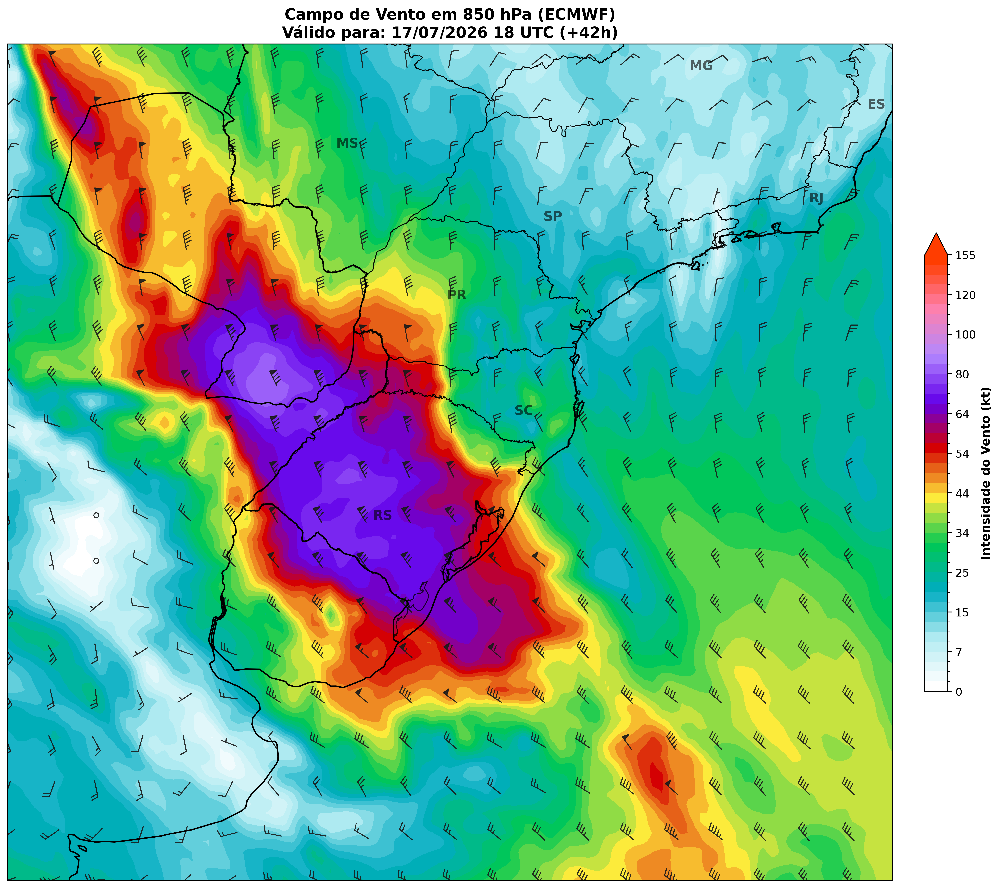

In [ ]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import matplotlib.colors as mcolors

# ============================================================
# CONFIGURAÇÕES E DADOS
# ============================================================
data_rodada = '20260716'
rodada = '00'
ano_prev, mes_prev, dia_prev, hora_prev = 2026, 7, 17, 18

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)
forecast_hour = round(forecast_hour / 3) * 3 if forecast_hour <= 144 else round(forecast_hour / 6) * 6

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo}'

if not os.path.exists(arquivo):
    print("Baixando dados do ECMWF...")
    r = requests.get(url)
    with open(arquivo, 'wb') as f: f.write(r.content)

# ============================================================
# CARREGAMENTO SEGURO DOS VENTOS (U e V em 850 hPa)
# ============================================================
print("Carregando componente U...")
ds_u = xr.open_dataset(
    arquivo,
    engine='cfgrib',
    backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': 850, 'shortName': 'u'}}
)

print("Carregando componente V...")
ds_v = xr.open_dataset(
    arquivo,
    engine='cfgrib',
    backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': 850, 'shortName': 'v'}}
)

# ÁREA AMPLA: longitude [-64 a -40] e latitude [-18 a -35]
u_wind = ds_u['u'].sel(longitude=slice(-64, -40), latitude=slice(-18, -40)) * 1.94384
v_wind = ds_v['v'].sel(longitude=slice(-64, -40), latitude=slice(-18, -40)) * 1.94384

# Cálculo da velocidade do vento (intensidade)
wind_speed = np.sqrt(u_wind**2 + v_wind**2)

# Fechamos os datasets para liberar memória RAM
ds_u.close()
ds_v.close()

# ============================================================
# INTERPOLAÇÃO PARA SUAVIZAÇÃO DO SOMBREAMENTO (SHADED)
# ============================================================
lon_fine = np.linspace(wind_speed.longitude.min().item(), wind_speed.longitude.max().item(), 300)
lat_fine = np.linspace(wind_speed.latitude.min().item(), wind_speed.latitude.max().item(), 300)

speed_interp = wind_speed.interp(longitude=lon_fine, latitude=lat_fine, method='linear')

# Interpolação dedicada para as farpas com espaçamento ideal para a nova área ampliada
lon_barbs = np.arange(wind_speed.longitude.min().item(), wind_speed.longitude.max().item() + 0.5, 1.2)
lat_barbs = np.arange(wind_speed.latitude.min().item(), wind_speed.latitude.max().item() + 0.5, 1.2)

u_barbs = u_wind.interp(longitude=lon_barbs, latitude=lat_barbs, method='linear')
v_barbs = v_wind.interp(longitude=lon_barbs, latitude=lat_barbs, method='linear')

# ============================================================
# CRIAÇÃO DA ESCALA DE CORES ULTRA-VIBRANTE (ALTO DESTAQUE)
# ============================================================
base_levels = [0, 7, 15, 25, 34, 44, 54, 64, 80, 100, 120, 155]

# Tons reajustados para alta saturação e forte transição tonal
colors_list = [
    '#FFFFFF',                         # 0 a 7 (Branco puro)
    '#B2EBF2', '#00ACC1',              # 7 a 34 (Ciano suave para Turquesa Elétrico)
    '#00C853', '#FFEB3B', '#D50000',  # 34 a 64 (Verde vivo -> Amarelo brilhante -> Vermelho puro)
    '#6200EA', '#B388FF', '#FF80AB', '#FF3D00' # 64 a 155 (Roxo Neon, Lilás Claro, Rosa Elétrico para Salmão Sólido)
]

cmap_continuous = mcolors.LinearSegmentedColormap.from_list('custom_wind_vibrant', colors_list, N=256)

# Criando sub-níveis para transição de gradiente ultra-suave no contourf
smooth_levels = []
for i in range(len(base_levels) - 1):
    smooth_levels.extend(np.linspace(base_levels[i], base_levels[i+1], 4, endpoint=False))
smooth_levels.append(base_levels[-1])
smooth_levels = np.array(smooth_levels)

cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_wind_vibrant_final',
    cmap_continuous(np.linspace(0, 1, len(smooth_levels)-1)),
    N=len(smooth_levels)-1
)
norm = mcolors.BoundaryNorm(smooth_levels, cmap.N)

# ============================================================
# PLOT
# ============================================================
fig = plt.figure(figsize=(14, 12),dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-64, -40, -40, -18], crs=ccrs.PlateCarree())

# 1. Plot sombreado (Shaded) com a nova paleta saturada
cf = ax.contourf(
    speed_interp.longitude, speed_interp.latitude, speed_interp.values,
    levels=smooth_levels, cmap=cmap, norm=norm, extend='max', antialiased=False
)

# 2. Plot das Farpas de Vento (Wind Barbs)
lon_mesh, lat_mesh = np.meshgrid(u_barbs.longitude, u_barbs.latitude)

ax.barbs(
    lon_mesh, lat_mesh, u_barbs.values, v_barbs.values,
    length=5.5,
    linewidth=0.9,               # Aumentada sutilmente a largura para melhor contraste com as cores vivas
    color='#1A1A1A',             # Grafite escuro para não contrastar de forma agressiva com tons pretos de contorno
    alpha=0.9,
    pivot='middle',
    sizes=dict(emptybarb=0.15, spacing=0.2, height=0.4),
    transform=ccrs.PlateCarree()
)

# Detalhes cartográficos destacados
ax.add_feature(cfeature.COASTLINE, linewidth=1.3, edgecolor='black', zorder=3)
ax.add_feature(cfeature.BORDERS, linewidth=1.3, edgecolor='black', zorder=3)

# Adiciona divisão dos estados brasileiros e países vizinhos
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='black', linewidth=0.8, alpha=0.8, transform=ccrs.PlateCarree(), zorder=3)

    # Siglas com sombra (efeito path_effects) ou cor limpa e nítida
    estados_visiveis = ['PR', 'SC', 'RS', 'SP', 'MS', 'RJ', 'MG', 'ES']
    for _, row in br_states.iterrows():
        if row['sigla'] in estados_visiveis:
            centroid = row['geometry'].representative_point()
            ax.text(centroid.x, centroid.y, row['sigla'], fontsize=12, fontweight='bold',
                    ha='center', va='center', color='black', alpha=0.6,
                    transform=ccrs.PlateCarree(), zorder=4)
except Exception as e:
    print(f"Erro ao carregar mapa de estados: {e}")
    pass

# Barra de cores adaptada aos novos níveis
cbar = plt.colorbar(cf, ax=ax, shrink=0.5, pad=0.03, ticks=base_levels)
cbar.set_label('Intensidade do Vento (kt)', fontsize=11, fontweight='bold')
cbar.ax.tick_params(labelsize=10)

plt.title(
    f'Campo de Vento em 850 hPa (ECMWF)\n'
    f'Válido para: {prev_dt.strftime("%d/%m/%Y %H UTC")} (+{forecast_hour}h)',
    fontsize=14, fontweight='bold'
)

plt.tight_layout()

# Salvamento otimizado em 400 DPI
plt.savefig("vento_850hpa_vibrante_400dpi.png", dpi=400, bbox_inches="tight", facecolor="white")
plt.show()

Carregando componente U em 250 hPa...
Carregando componente V em 250 hPa...


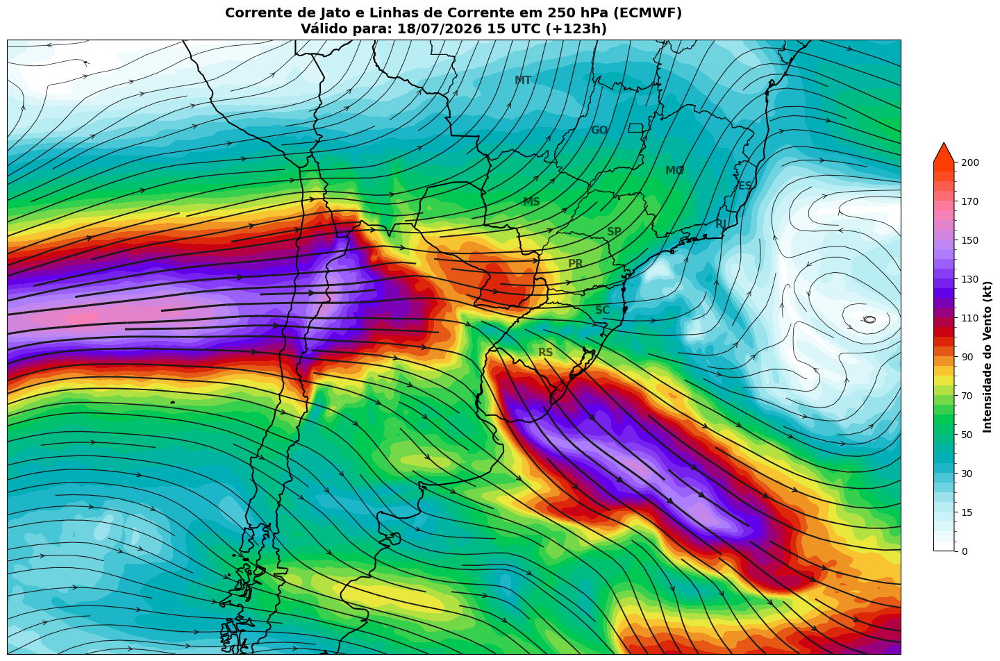

In [ ]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import matplotlib.colors as mcolors

# ============================================================
# CONFIGURAÇÕES E DADOS
# ============================================================
data_rodada = '20260713'
rodada = '12'
ano_prev, mes_prev, dia_prev, hora_prev = 2026, 7, 18, 15

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)
forecast_hour = round(forecast_hour / 3) * 3 if forecast_hour <= 144 else round(forecast_hour / 6) * 6

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo}'

if not os.path.exists(arquivo):
    print("Baixando dados do ECMWF...")
    r = requests.get(url)
    with open(arquivo, 'wb') as f: f.write(r.content)

# ============================================================
# CARREGAMENTO SEGURO DOS VENTOS (U e V em 250 hPa)
# ============================================================
print("Carregando componente U em 250 hPa...")
ds_u = xr.open_dataset(
    arquivo,
    engine='cfgrib',
    backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': 250, 'shortName': 'u'}}
)

print("Carregando componente V em 250 hPa...")
ds_v = xr.open_dataset(
    arquivo,
    engine='cfgrib',
    backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': 250, 'shortName': 'v'}}
)

# ÁREA BEM MAIS AMPLA para capturar o Jato em escala sinótica:
u_wind = ds_u['u'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)) * 1.94384
v_wind = ds_v['v'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)) * 1.94384

# Cálculo da velocidade do vento (intensidade)
wind_speed = np.sqrt(u_wind**2 + v_wind**2)

ds_u.close()
ds_v.close()

# ============================================================
# INTERPOLAÇÃO PARA SOMBREAMENTO E LINHAS DE CORRENTE
# ============================================================
lon_fine = np.linspace(wind_speed.longitude.min().item(), wind_speed.longitude.max().item(), 400)
lat_fine = np.linspace(wind_speed.latitude.min().item(), wind_speed.latitude.max().item(), 400)

speed_interp = wind_speed.interp(longitude=lon_fine, latitude=lat_fine, method='linear')
u_interp = u_wind.interp(longitude=lon_fine, latitude=lat_fine, method='linear')
v_interp = v_wind.interp(longitude=lon_fine, latitude=lat_fine, method='linear')

# ============================================================
# CRIAÇÃO DA ESCALA DE CORES ULTRA-VIBRANTE (ALTO DESTAQUE)
# ============================================================
base_levels = [0, 15, 30, 50, 70, 90, 110, 130, 150, 170, 200]

colors_list = [
    '#FFFFFF',                         # 0 a 15 (Branco puro)
    '#B2EBF2', '#00ACC1',              # 15 a 50 (Ciano suave para Turquesa Elétrico)
    '#00C853', '#FFEB3B', '#D50000',  # 50 a 110 (Verde vivo -> Amarelo brilhante -> Vermelho puro)
    '#6200EA', '#B388FF', '#FF80AB', '#FF3D00' # 110 a 200 (Roxo Neon, Lilás Claro, Rosa Elétrico para Salmão Sólido)
]

cmap_continuous = mcolors.LinearSegmentedColormap.from_list('custom_wind_250', colors_list, N=256)

smooth_levels = []
for i in range(len(base_levels) - 1):
    smooth_levels.extend(np.linspace(base_levels[i], base_levels[i+1], 4, endpoint=False))
smooth_levels.append(base_levels[-1])
smooth_levels = np.array(smooth_levels)

cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_wind_250_final',
    cmap_continuous(np.linspace(0, 1, len(smooth_levels)-1)),
    N=len(smooth_levels)-1
)
norm = mcolors.BoundaryNorm(smooth_levels, cmap.N)

# ============================================================
# PLOT
# ============================================================
fig = plt.figure(figsize=(16, 11))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-90, -30, -50, -10], crs=ccrs.PlateCarree())

# 1. Plot sombreado (Shaded) com zorder garantido para ficar abaixo das linhas
cf = ax.contourf(
    speed_interp.longitude, speed_interp.latitude, speed_interp.values,
    levels=smooth_levels, cmap=cmap, norm=norm, extend='max', antialiased=False,
    zorder=2
)

# 2. Plot das Linhas de Corrente (Streamlines) dinâmicas por cima das cores (zorder=3)
lw = 0.5 + 2.2 * (speed_interp.values / 200.0)

ax.streamplot(
    lon_fine, lat_fine, u_interp.values, v_interp.values,
    density=1.8,
    linewidth=lw,
    color='#1A1A1A',
    arrowsize=1.1,
    arrowstyle='->',
    transform=ccrs.PlateCarree(),
    zorder=3
)

# Fronteiras e linhas de costa desenhadas no topo absoluto (zorder=4) para manter a nitidez
ax.add_feature(cfeature.COASTLINE, linewidth=1.4, edgecolor='black', zorder=4)
ax.add_feature(cfeature.BORDERS, linewidth=1.4, edgecolor='black', zorder=4)

# Divisões de estados brasileiros
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='black', linewidth=0.8, alpha=0.7, transform=ccrs.PlateCarree(), zorder=4)

    estados_visiveis = ['PR', 'SC', 'RS', 'SP', 'MS', 'RJ', 'MG', 'ES', 'GO', 'MT']
    for _, row in br_states.iterrows():
        if row['sigla'] in estados_visiveis:
            centroid = row['geometry'].representative_point()
            ax.text(centroid.x, centroid.y, row['sigla'], fontsize=11, fontweight='bold',
                    ha='center', va='center', color='black', alpha=0.6,
                    transform=ccrs.PlateCarree(), zorder=5)
except Exception as e:
    print(f"Erro ao carregar mapa de estados: {e}")
    pass

# Barra de cores
cbar = plt.colorbar(cf, ax=ax, shrink=0.55, pad=0.03, ticks=base_levels)
cbar.set_label('Intensidade do Vento (kt)', fontsize=11, fontweight='bold')
cbar.ax.tick_params(labelsize=10)

plt.title(
    f'Corrente de Jato e Linhas de Corrente em 250 hPa (ECMWF)\n'
    f'Válido para: {prev_dt.strftime("%d/%m/%Y %H UTC")} (+{forecast_hour}h)',
    fontsize=14, fontweight='bold'
)

plt.tight_layout()

# Salvamento ultra nítido em 400 DPI com fundo branco limpo
plt.savefig("vento_250hpa_linhas_de_corrente_400dpi.png", dpi=400, bbox_inches="tight", facecolor="white")
plt.show()

Baixando dados do ECMWF...
Carregando componentes de vento de múltiplos níveis...
1000 hPa carregado.
925 hPa carregado.
850 hPa carregado.
700 hPa carregado.
600 hPa carregado.
500 hPa carregado.
Carregando MUCAPE...
<xarray.Dataset> Size: 4MB
Dimensions:             (latitude: 721, longitude: 1440)
Coordinates:
  * latitude            (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
  * longitude           (longitude) float64 12kB -180.0 -179.8 ... 179.5 179.8
    time                datetime64[ns] 8B ...
    step                timedelta64[ns] 8B ...
    mostUnstableParcel  float64 8B ...
    valid_time          datetime64[ns] 8B ...
Data variables:
    mucape              (latitude, longitude) float32 4MB ...
Attributes:
    GRIB_edition:            2
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre f

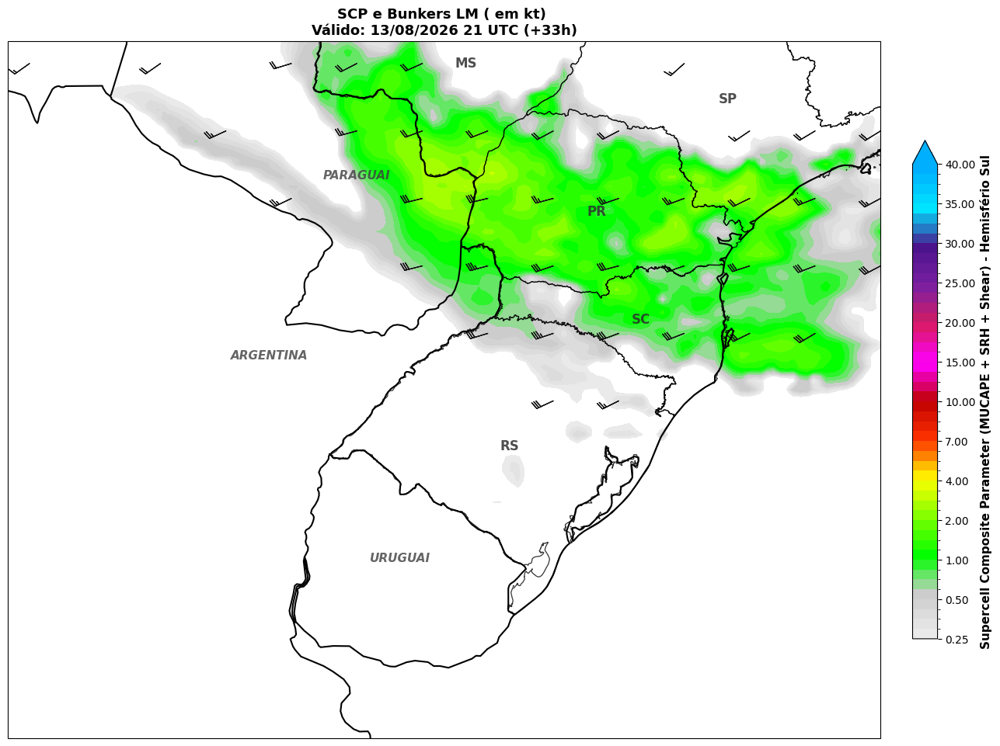

In [ ]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import matplotlib.colors as mcolors

# ============================================================
# CONFIGURAÇÕES E DADOS
# ============================================================
data_rodada = '20260812'
rodada = '12'
ano_prev, mes_prev, dia_prev, hora_prev = 2026, 8, 13, 21

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)
forecast_hour = round(forecast_hour / 3) * 3 if forecast_hour <= 144 else round(forecast_hour / 6) * 6

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo}'

if not os.path.exists(arquivo):
    print("Baixando dados do ECMWF...")
    r = requests.get(url)
    with open(arquivo, 'wb') as f: f.write(r.content)

# ============================================================
# CARREGAMENTO DOS DADOS MULTINÍVEL (Vento em m/s)
# ============================================================
print("Carregando componentes de vento de múltiplos níveis...")

def get_wind_level(level):
    """Retorna U e V em m/s para um determinado nível de pressão"""
    ds_u = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': level, 'shortName': 'u'}})
    ds_v = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': level, 'shortName': 'v'}})

    # Recorte da área da América do Sul
    u = ds_u['u'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50))
    v = ds_v['v'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50))

    u_val = u.load()
    v_val = v.load()

    ds_u.close()
    ds_v.close()
    return u_val, v_val

levels = [
    1000,
    925,
    850,
    700,
    600,
    500
]

u_levels = {}
v_levels = {}

for level in levels:

    try:

        u,v = get_wind_level(level)

        u_levels[level] = u
        v_levels[level] = v

        print(f"{level} hPa carregado.")

    except:
        print(f"{level} hPa não encontrado.")


# Variáveis utilizadas posteriormente

u1000 = u_levels[1000]
v1000 = v_levels[1000]

u925 = u_levels[925]
v925 = v_levels[925]

u850 = u_levels[850]
v850 = v_levels[850]

u700 = u_levels[700]
v700 = v_levels[700]

u600 = u_levels[600]
v600 = v_levels[600]

u500 = u_levels[500]
v500 = v_levels[500]


# ============================================================
# CARREGAMENTO DO CAPE SEM CONFLITOS DE COORDENADAS
# ============================================================


print("Carregando MUCAPE...")

ds_mu = xr.open_dataset(
    arquivo,
    engine="cfgrib",
    backend_kwargs={
        "filter_by_keys":{
            "shortName":"mucape"
        }
    }
)

print(ds_mu)

mucape = ds_mu[list(ds_mu.data_vars)[0]].sel(
    longitude=slice(-90,-30),
    latitude=slice(-10,-50)
).load()

ds_mu.close()

print("MUCAPE carregado:", mucape.name)


# ============================================================
# CÁLCULOS METEOROLÓGICOS ADAPTADOS PARA O HEMISFÉRIO SUL
# ============================================================
print("Calculando parâmetros de cisalhamento e movimento de tempestades (Bunkers LM)...")

#==========================================================
# 1. Bulk Shear 0-6 km
#==========================================================

u_shear_06 = u500-u1000
v_shear_06 = v500-v1000

mag_shear_06 = np.sqrt(

    u_shear_06**2 +
    v_shear_06**2

)

# evita divisão por zero
mag_shear_06 = xr.where(
    mag_shear_06 < 0.1,
    0.1,
    mag_shear_06
)

#==========================================================
# 2. Vento Médio 0-6 km
#==========================================================

mean_levels = [

    1000,
    925,
    850,
    700,
    600,
    500

]


u_mean_06 = sum(
    u_levels[level]
    for level in mean_levels
)/len(mean_levels)


v_mean_06 = sum(
    v_levels[level]
    for level in mean_levels
)/len(mean_levels)

#==========================================================
# 3. Movimento da Supercélula (Bunkers LM)
#==========================================================

u_lm = u_mean_06 - (
    7.5*(v_shear_06/mag_shear_06)
)

v_lm = v_mean_06 + (
    7.5*(u_shear_06/mag_shear_06)
)

#==========================================================
# 4. Storm Relative Helicity (0-3 km)
#==========================================================

print("Calculando Storm Relative Helicity (SRH)...")

levels_srh = [

    1000,
    925,
    850,
    700

]

srh = 0

for i in range(len(levels_srh)-1):

    l1 = levels_srh[i]
    l2 = levels_srh[i+1]

    termo = (

        ((u_levels[l2]-u_lm)*
        (v_levels[l2]-v_levels[l1]))

        -

        ((v_levels[l2]-v_lm)*
        (u_levels[l2]-u_levels[l1]))

    )

    srh += termo


srh_03 = np.abs(srh)


# 5. Cálculo do SCP (Supercell Composite Parameter) ajustado para o HS
print("Processando SCP...")

#==========================================================
# Termo do cisalhamento
#==========================================================

shear_term = mag_shear_06/20.

# menor que 10 m/s
shear_term = xr.where(
    mag_shear_06 < 10,
    0,
    shear_term
)

# maior que 20 m/s
shear_term = xr.where(
    mag_shear_06 > 20,
    1,
    shear_term
)

#==========================================================
# SCP FINAL
#==========================================================

scp = (
    (mucape/1000.)*
    (srh_03/100.)*
    shear_term
)

scp = xr.where(
    scp < 0,
    0,
    scp
)

# ============================================================
# INTERPOLAÇÃO PARA SOMBREAMENTO SUAVE E AJUSTE DE DENSIDADE DAS FARPAS
# ============================================================
lon_fine = np.linspace(u1000.longitude.min().item(), u1000.longitude.max().item(), 400)
lat_fine = np.linspace(u1000.latitude.min().item(), u1000.latitude.max().item(), 400)
scp_interp = scp.interp(longitude=lon_fine, latitude=lat_fine, method='linear')

# AJUSTE: Reduzido de 3.0 para 1.5 graus para trazer consideravelmente mais farpas ao mapa
lon_vec = np.arange(u1000.longitude.min().item(), u1000.longitude.max().item() + 0.1, 1.5)
lat_vec = np.arange(u1000.latitude.min().item(), u1000.latitude.max().item() + 0.1, 1.5)

u_lm_vec = u_lm.interp(longitude=lon_vec, latitude=lat_vec, method='linear')
v_lm_vec = v_lm.interp(longitude=lon_vec, latitude=lat_vec, method='linear')

# Converter vetor Bunkers LM de m/s para nós (kt) para farpas
u_lm_kt = u_lm_vec * 1.94384
v_lm_kt = v_lm_vec * 1.94384

# ============================================================
# PALETA DE CORES ATUALIZADA (SEM SALMÃO)
# Transição direta de Amarelo -> Vermelho -> Magenta -> Roxo -> Azul/Ciane
# ============================================================
scp_levels = [0.25, 0.5, 1, 2, 4, 7, 10, 15, 20, 25, 30, 35, 40]

colors_scp = [
    '#EAEAEA', '#CCCCCC',              # 0.25 a 1 (Cinzas limpos)
    '#00FF00', '#7FFF00',              # 1 a 2 (Verdes vibrantes)
    '#FFFF00',                         # 2 a 4 (Amarelo puro)
    '#FF3300',                         # 4 a 7 (Vermelho vivo - REMOVIDO SALMÃO/LARANJA)
    '#C00000',                         # 7 a 10 (Vermelho escuro)
    '#FF00FF', '#D81B60',              # 10 a 20 (Rosa / Magenta intenso)
    '#7B1FA2', '#4A148C',              # 20 a 30 (Roxo / Violeta Escuro)
    '#00E5FF', '#00B0FF'               # 30 a 40 (Azul Ciane / Azul Piscina)
]

cmap_continuous = mcolors.LinearSegmentedColormap.from_list('custom_scp', colors_scp, N=256)

smooth_levels = []
for i in range(len(scp_levels) - 1):
    smooth_levels.extend(np.linspace(scp_levels[i], scp_levels[i+1], 4, endpoint=False))
smooth_levels.append(scp_levels[-1])
smooth_levels = np.array(smooth_levels)

cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_scp_final',
    cmap_continuous(np.linspace(0, 1, len(smooth_levels)-1)),
    N=len(smooth_levels)-1
)
norm = mcolors.BoundaryNorm(smooth_levels, cmap.N)

# ============================================================
# PLOT DO MAPA COM ZOOM NO SUL DO BRASIL E ADJACÊNCIAS
# ============================================================
fig = plt.figure(figsize=(14, 11))
ax = plt.axes(projection=ccrs.PlateCarree())

# AJUSTE: Coordenadas do Zoom focando no Sul do BR e entorno [Oeste, Leste, Sul, Norte]
ax.set_extent([-65.0, -45.0, -36.5, -21.0], crs=ccrs.PlateCarree())

# 1. Plot Sombreamento do SCP
cf = ax.contourf(
    scp_interp.longitude, scp_interp.latitude, scp_interp.values,
    levels=smooth_levels, cmap=cmap, norm=norm, extend='max', antialiased=False,
    zorder=2
)

# 2. Plot das Farpas do Bunkers LM (Filtradas onde há energia convectiva relevante > 100 J/kg)
lon_mesh, lat_mesh = np.meshgrid(u_lm_kt.longitude, u_lm_kt.latitude)
mucape_mask = mucape.interp(
    longitude=lon_vec,
    latitude=lat_vec,
    method='linear'
)

u_lm_masked = xr.where(
    mucape_mask > 100,
    u_lm_kt,
    np.nan
)

v_lm_masked = xr.where(
    mucape_mask > 100,
    v_lm_kt,
    np.nan
)

ax.barbs(
    lon_mesh, lat_mesh, u_lm_masked.values, v_lm_masked.values,
    length=5.8,
    linewidth=0.9,
    color='#151515',
    fill_empty=True,
    transform=ccrs.PlateCarree(),
    zorder=3
)

# Fronteiras e cartografia
ax.add_feature(cfeature.COASTLINE, linewidth=1.5, edgecolor='black', zorder=4)
ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black', zorder=4)

# Divisões estaduais brasileiras e nomes de países
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='black', linewidth=0.9, alpha=0.8, transform=ccrs.PlateCarree(), zorder=4)

    # Textos de auxílio visual dos estados brasileiros
    estados_visiveis = {
        'RS': (-53.5, -30.0), 'SC': (-50.5, -27.2), 'PR': (-51.5, -24.8),
        'SP': (-48.5, -22.3), 'MS': (-54.5, -21.5)
    }
    for sigla, coords in estados_visiveis.items():
         ax.text(coords[0], coords[1], sigla, fontsize=12, fontweight='bold',
                 ha='center', va='center', color='#2F2F2F', alpha=0.85,
                 transform=ccrs.PlateCarree(), zorder=5)

    # Identificação dos vizinhos
    ax.text(-56.0, -32.5, 'URUGUAI', fontsize=11, fontweight='bold', style='italic',
            ha='center', va='center', color='#3F3F3F', alpha=0.8, transform=ccrs.PlateCarree(), zorder=5)
    ax.text(-59.0, -28.0, 'ARGENTINA', fontsize=11, fontweight='bold', style='italic',
            ha='center', va='center', color='#3F3F3F', alpha=0.8, transform=ccrs.PlateCarree(), zorder=5)
    ax.text(-57.0, -24.0, 'PARAGUAI', fontsize=11, fontweight='bold', style='italic',
            ha='center', va='center', color='#3F3F3F', alpha=0.8, transform=ccrs.PlateCarree(), zorder=5)
except Exception as e:
    print(f"Aviso: Não foi possível carregar os rótulos detalhados do GeoJSON. {e}")

# Barra de Cores
cbar = plt.colorbar(cf, ax=ax, shrink=0.6, pad=0.03, ticks=scp_levels)
cbar.set_label(
    'Supercell Composite Parameter (MUCAPE + SRH + Shear) - Hemisfério Sul',
    fontsize=11,
    fontweight='bold'
)
cbar.ax.tick_params(labelsize=10)

plt.title(
    f'SCP e Bunkers LM ( em kt) \n'
    f'Válido: {prev_dt.strftime("%d/%m/%Y %H UTC")} (+{forecast_hour}h)',
    fontsize=13, fontweight='bold'
)

plt.tight_layout()
plt.savefig("scp_bunkers_hs_zoom_400dpi.png", dpi=400, bbox_inches="tight", facecolor="white")
plt.show()

Carregando componentes de vento de múltiplos níveis...
Carregando campos de superfície (T2M, D2M, Ventos a 10m)...
Carregando campo de MUCAPE...
Calculando parâmetros de cisalhamento, LCL e STP...
Calculando vetores de BWD de 0-1 km...


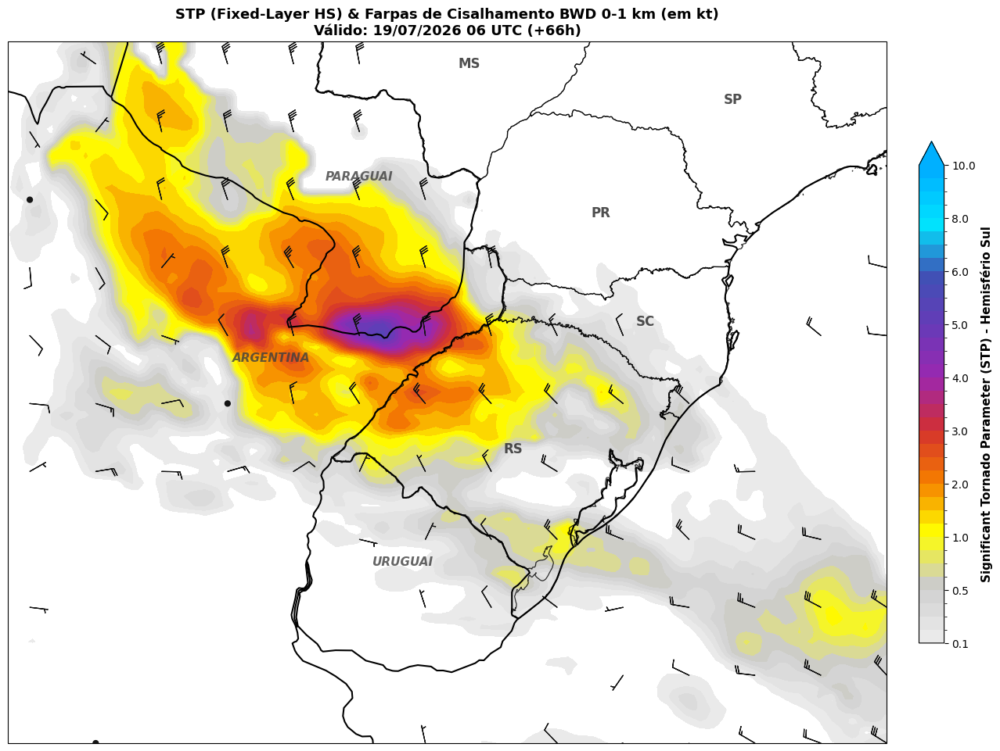

In [ ]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import matplotlib.colors as mcolors

# ============================================================
# CONFIGURAÇÕES E DADOS
# ============================================================
data_rodada = '20260716'
rodada = '12'
ano_prev, mes_prev, dia_prev, hora_prev = 2026, 7, 19, 6

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)
forecast_hour = round(forecast_hour / 3) * 3 if forecast_hour <= 144 else round(forecast_hour / 6) * 6

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo}'

if not os.path.exists(arquivo):
    print("Baixando dados do ECMWF...")
    r = requests.get(url)
    with open(arquivo, 'wb') as f: f.write(r.content)

# ============================================================
# CARREGAMENTO DOS DADOS MULTINÍVEL (Vento em m/s)
# ============================================================
print("Carregando componentes de vento de múltiplos níveis...")

def get_wind_level(level):
    """Retorna U e V em m/s para um determinado nível de pressão"""
    ds_u = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': level, 'shortName': 'u'}})
    ds_v = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': level, 'shortName': 'v'}})

    u = ds_u['u'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50))
    v = ds_v['v'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50))

    u_val = u.load()
    v_val = v.load()

    ds_u.close()
    ds_v.close()
    return u_val, v_val

# Níveis para STP e interpolação do nível de 1 km (~900 hPa)
u1000, v1000 = get_wind_level(1000)
u925, v925 = get_wind_level(925)
u850, v850 = get_wind_level(850)
u700, v700 = get_wind_level(700)
u500, v500 = get_wind_level(500)

# ============================================================
# CARREGAMENTO DE VARIÁVEIS DE SUPERFÍCIE
# ============================================================
print("Carregando campos de superfície (T2M, D2M, Ventos a 10m)...")

ds_sfc = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'typeOfLevel': 'heightAboveGround', 'level': 2}})
t2m = ds_sfc['t2m'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)).load() - 273.15
d2m = ds_sfc['d2m'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)).load() - 273.15
ds_sfc.close()

ds_wind10 = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'typeOfLevel': 'heightAboveGround', 'level': 10}})
u10 = ds_wind10['u10'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)).load()
v10 = ds_wind10['v10'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)).load()
ds_wind10.close()

# ============================================================
# CARREGAMENTO DO MUCAPE
# ============================================================
print("Carregando campo de MUCAPE...")
try:
    ds_cape = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'shortName': 'mucape'}})
    cape = ds_cape['mucape'].sel(longitude=slice(-90, -30), latitude=slice(-10, -50)).load()
    ds_cape.close()
except Exception as e:
    raise KeyError(f"Erro ao obter MUCAPE: {e}")

# ============================================================
# CÁLCULOS METEOROLÓGICOS DO STP (HEMISFÉRIO SUL)
# ============================================================
print("Calculando parâmetros de cisalhamento, LCL e STP...")

# 1. Cisalhamento Vertical de Vento 0-6 km
u_shear_06 = u500 - u1000
v_shear_06 = v500 - v1000
mag_shear_06 = np.sqrt(u_shear_06**2 + v_shear_06**2)
mag_shear_06 = xr.where(mag_shear_06 < 0.1, 0.1, mag_shear_06)

# 2. Vento Médio 0-6 km e Vetor Bunkers LM (Left-Mover para o HS)
u_mean_06 = (u1000 + u850 + u700 + u500) / 4.0
v_mean_06 = (v1000 + v850 + v700 + v500) / 4.0
u_lm = u_mean_06 - (7.5 * (v_shear_06 / mag_shear_06))
v_lm = v_mean_06 + (7.5 * (u_shear_06 / mag_shear_06))

# 3. Altura Estimada do LCL
lcl = 125.0 * (t2m - d2m)
lcl = xr.where(lcl < 0.0, 0.0, lcl)

# 4. Helicidade Relativa (SRH 0-1 km) adaptada ao HS
srh_step1 = ((u1000 - u_lm) * (v1000 - v10)) - ((v1000 - v_lm) * (u1000 - u10))
srh_step2 = ((u925 - u_lm) * (v925 - v1000)) - ((v925 - v_lm) * (u925 - u1000))
srh_step3 = ((u850 - u_lm) * (v850 - v925)) - ((v850 - v_lm) * (u850 - u925))
srh_01 = np.abs(srh_step1 + srh_step2 + srh_step3)

# 5. STP Normalizado (Thompson et al., 2003)
term_cape = cape / 1500.0
term_srh = srh_01 / 150.0
term_shear = mag_shear_06 / 20.0
term_shear = xr.where(mag_shear_06 < 12.5, 0.0, term_shear)
term_shear = xr.where(mag_shear_06 > 30.0, 1.5, term_shear)
term_lcl = (2000.0 - lcl) / 1500.0
term_lcl = xr.where(lcl < 1000.0, 1.0, term_lcl)
term_lcl = xr.where(lcl > 2000.0, 0.0, term_lcl)

stp = term_cape * term_srh * term_shear * term_lcl
stp = xr.where(stp < 0, 0, stp).fillna(0.0)

# ============================================================
# CÁLCULO DO BWD 0-1 KM (BULK WIND DIFFERENCE) - VETORES
# ============================================================
print("Calculando vetores de BWD de 0-1 km...")

# Interpolação para encontrar o vento em ~1 km (nível de 900 hPa)
u_1km = u925 + (u850 - u925) * ((925 - 900) / (925 - 850))
v_1km = v925 + (v850 - v925) * ((925 - 900) / (925 - 850))

# Vetor diferença (Cisalhamento 0-1 km)
du_01 = u_1km - u10
dv_01 = v_1km - v10

# ============================================================
# INTERPOLAÇÃO PARA SOMBREAMENTO SUAVE E REDUÇÃO DE DENSIDADE DAS FARPAS
# ============================================================
lon_fine = np.linspace(u1000.longitude.min().item(), u1000.longitude.max().item(), 400)
lat_fine = np.linspace(u1000.latitude.min().item(), u1000.latitude.max().item(), 400)

stp_interp = stp.interp(longitude=lon_fine, latitude=lat_fine, method='linear')

# Amostragem das farpas com espaçamento de 1.5 graus (evita poluição visual no mapa)
lon_vec = np.arange(u1000.longitude.min().item(), u1000.longitude.max().item() + 0.1, 1.5)
lat_vec = np.arange(u1000.latitude.min().item(), u1000.latitude.max().item() + 0.1, 1.5)

du_01_vec = du_01.interp(longitude=lon_vec, latitude=lat_vec, method='linear')
dv_01_vec = dv_01.interp(longitude=lon_vec, latitude=lat_vec, method='linear')

# Convertendo o vetor diferença de m/s para nós (kt) para plotar as farpas corretamente
du_01_kt = du_01_vec * 1.94384
dv_01_kt = dv_01_vec * 1.94384

# ============================================================
# CONFIGURAÇÃO DE CORES (STP)
# ============================================================
stp_levels = [0.1, 0.5, 1, 2, 3, 4, 5, 6, 8, 10]
colors_stp = ['#EAEAEA', '#CCCCCC', '#FFFF00', '#F57C00', '#D32F2F', '#9C27B0', '#673AB7', '#3F51B5', '#00E5FF', '#00B0FF']
cmap_continuous = mcolors.LinearSegmentedColormap.from_list('custom_stp', colors_stp, N=256)

smooth_levels = []
for i in range(len(stp_levels) - 1):
    smooth_levels.extend(np.linspace(stp_levels[i], stp_levels[i+1], 4, endpoint=False))
smooth_levels.append(stp_levels[-1])
smooth_levels = np.array(smooth_levels)

cmap = mcolors.LinearSegmentedColormap.from_list('custom_stp_final', cmap_continuous(np.linspace(0, 1, len(smooth_levels)-1)), N=len(smooth_levels)-1)
norm = mcolors.BoundaryNorm(smooth_levels, cmap.N)

# ============================================================
# PLOT DO MAPA
# ============================================================
fig = plt.figure(figsize=(14, 11))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-65.0, -45.0, -36.5, -21.0], crs=ccrs.PlateCarree())

# 1. Sombreamento do STP (Fundo)
cf = ax.contourf(
    stp_interp.longitude, stp_interp.latitude, stp_interp.values,
    levels=smooth_levels, cmap=cmap, norm=norm, extend='max', antialiased=False,
    zorder=2
)

# 2. Plot das Farpas de Vento representando o BWD 0-1 km (em kt)
# Filtrando as farpas para aparecerem apenas onde o CAPE é relevante (> 100 J/kg)
lon_mesh, lat_mesh = np.meshgrid(du_01_kt.longitude, du_01_kt.latitude)
cape_mask = cape.interp(longitude=lon_vec, latitude=lat_vec, method='linear')
du_01_masked = xr.where(cape_mask > 100, du_01_kt, np.nan)
dv_01_masked = xr.where(cape_mask > 100, dv_01_kt, np.nan)

ax.barbs(
    lon_mesh, lat_mesh, du_01_masked.values, dv_01_masked.values,
    length=5.8,
    linewidth=0.9,
    color='#151515',
    fill_empty=True,
    transform=ccrs.PlateCarree(),
    zorder=3
)

# Fronteiras e divisões políticas
ax.add_feature(cfeature.COASTLINE, linewidth=1.5, edgecolor='black', zorder=4)
ax.add_feature(cfeature.BORDERS, linewidth=1.5, edgecolor='black', zorder=4)

try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='black', linewidth=0.9, alpha=0.8, transform=ccrs.PlateCarree(), zorder=4)

    estados_visiveis = {
        'RS': (-53.5, -30.0), 'SC': (-50.5, -27.2), 'PR': (-51.5, -24.8),
        'SP': (-48.5, -22.3), 'MS': (-54.5, -21.5)
    }
    for sigla, coords in estados_visiveis.items():
         ax.text(coords[0], coords[1], sigla, fontsize=12, fontweight='bold',
                 ha='center', va='center', color='#2F2F2F', alpha=0.85,
                 transform=ccrs.PlateCarree(), zorder=5)

    # Textos adicionais para países fronteiriços
    ax.text(-56.0, -32.5, 'URUGUAI', fontsize=11, fontweight='bold', style='italic',
            ha='center', va='center', color='#3F3F3F', alpha=0.8, transform=ccrs.PlateCarree(), zorder=5)
    ax.text(-59.0, -28.0, 'ARGENTINA', fontsize=11, fontweight='bold', style='italic',
            ha='center', va='center', color='#3F3F3F', alpha=0.8, transform=ccrs.PlateCarree(), zorder=5)
    ax.text(-57.0, -24.0, 'PARAGUAI', fontsize=11, fontweight='bold', style='italic',
            ha='center', va='center', color='#3F3F3F', alpha=0.8, transform=ccrs.PlateCarree(), zorder=5)
except Exception as e:
    print(f"Não foi possível plotar limites estaduais refinados: {e}")

# Barra de Cores para o STP
cbar = plt.colorbar(cf, ax=ax, shrink=0.6, pad=0.03, ticks=stp_levels)
cbar.set_label('Significant Tornado Parameter (STP) - Hemisfério Sul', fontsize=11, fontweight='bold')
cbar.ax.tick_params(labelsize=10)

plt.title(
    f'STP (Fixed-Layer HS) & Farpas de Cisalhamento BWD 0-1 km (em kt)\n'
    f'Válido: {prev_dt.strftime("%d/%m/%Y %H UTC")} (+{forecast_hour}h)',
    fontsize=13, fontweight='bold'
)

plt.tight_layout()
plt.savefig("stp_bwd_01_farpas_hs_400dpi.png", dpi=400, bbox_inches="tight", facecolor="white")
plt.show()

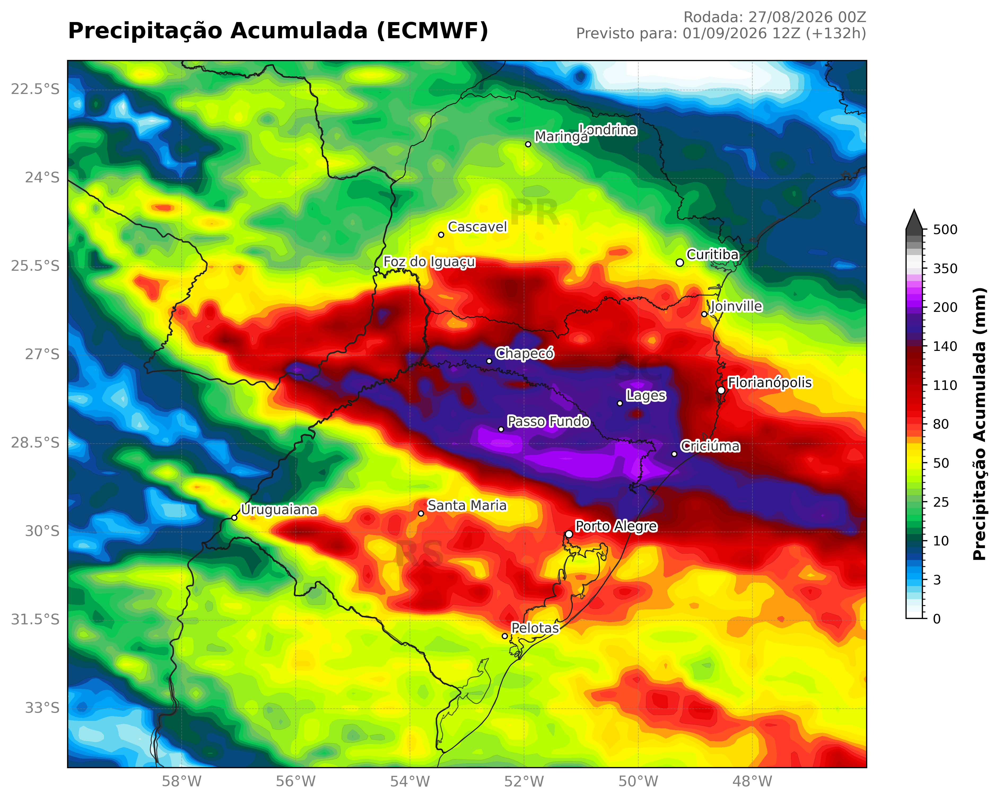

In [ ]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects

# ============================================================
# CONFIGURAÇÕES E DADOS
# ============================================================
data_rodada = '20260827'
rodada = '00'
ano_prev, mes_prev, dia_prev, hora_prev = 2026, 9, 1, 12

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)
forecast_hour = round(forecast_hour / 3) * 3 if forecast_hour <= 144 else round(forecast_hour / 6) * 6

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo}'

if not os.path.exists(arquivo):
    print("Baixando dados do ECMWF...")
    r = requests.get(url)
    with open(arquivo, 'wb') as f: f.write(r.content)

ds = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'shortName': 'tp'}})
precip_data = ds['tp'].sel(longitude=slice(-60, -46), latitude=slice(-22, -34)) * 1000

# ============================================================
# INTERPOLAÇÃO
# ============================================================
lon_fine = np.linspace(precip_data.longitude.min().item(), precip_data.longitude.max().item(), 200)
lat_fine = np.linspace(precip_data.latitude.min().item(), precip_data.latitude.max().item(), 200)
precip_interpolated = precip_data.interp(longitude=lon_fine, latitude=lat_fine, method='linear').fillna(0)

# ESCALA E ESTILIZAÇÃO
# ============================================================

base_levels = [
    0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 40, 50, 60, 70, 80,
    90, 100, 110, 120, 130, 140, 150, 175, 200, 250, 300, 350, 400, 450, 500
]

# Cores
# Laranja reduzido: transição mais rápida do amarelo para o vermelho
colors = [
    '#FFFFFF', '#E0F7FA', '#80DEEA', '#00B0FF', '#0091EA', '#0D47A1',
    '#004D40', '#00C853', '#66BB6A', '#AAFF00', '#FFFF00',
    '#FFD600', '#FF5722', '#FF2C2C', '#E60000',
    '#CC0000', '#B30000', '#990000', '#7F0000',
    '#311B92', '#4A148C', '#AA00FF', '#E040FB',
    '#EEEEEE', '#FFFFFF', '#9E9E9E', '#424242'
]

# Posições personalizadas das cores
# O laranja fica concentrado em uma faixa pequena
positions = [
    0.00, 0.03, 0.06, 0.09, 0.12, 0.15,
    0.20, 0.25, 0.30, 0.35, 0.40,
    0.45,
    0.47,   # laranja
    0.50,   # vermelho começa rapidamente
    0.53, 0.57, 0.61, 0.65, 0.69,
    0.74, 0.78, 0.82, 0.86,
    0.90, 0.93, 0.96, 1.00
]

cmap_continuous = mcolors.LinearSegmentedColormap.from_list(
    'precip_vibrant_smooth',
    list(zip(positions, colors)),
    N=256
)

# ============================================================
# PLOT
# ============================================================
fig = plt.figure(figsize=(12, 10), facecolor='white',dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-60, -46, -34, -22], crs=ccrs.PlateCarree())

# Plot principal
cf = ax.contourf(precip_interpolated.longitude, precip_interpolated.latitude, precip_interpolated.values,
                 levels=smooth_levels, cmap=cmap, norm=norm, extend='max', antialiased=False)

# Contornos internos sutis
ax.contour(precip_interpolated.longitude, precip_interpolated.latitude, precip_interpolated.values,
           levels=base_levels[::5], colors='black', linewidths=0.2, alpha=0.2)

# Recursos cartográficos
ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor='#333333')
ax.add_feature(cfeature.BORDERS, linewidth=1.0, edgecolor='#222222')

# Linhas de Grade
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.4, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10, 'color': 'gray'}
gl.ylabel_style = {'size': 10, 'color': 'gray'}

# Estados do Brasil (Sigla SC movida um pouco para cima)
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='#111111', linewidth=0.6, alpha=0.7, transform=ccrs.PlateCarree())

    for _, row in br_states.iterrows():
        if row['sigla'] in ['PR', 'SC', 'RS']:
            centroid = row['geometry'].representative_point()
            lon_txt, lat_txt = centroid.x, centroid.y

            # Move apenas a sigla "SC" ligeiramente para cima para não bater em Lages
            if row['sigla'] == 'SC':
                lat_txt += 0.4

            ax.text(lon_txt, lat_txt, row['sigla'], fontsize=24, fontweight='bold',
                    ha='center', va='center', alpha=0.12, color='black', transform=ccrs.PlateCarree())
except:
    pass

# ============================================================
# CIDADES PRINCIPAIS (TODAS PADRONIZADAS)
# ============================================================
cidades_sul = {
    # Rio Grande do Sul
    'Porto Alegre': (-51.2177, -30.0346, 'cap'),
    'Pelotas': (-52.3426, -31.7654, 'ind'),
    'Santa Maria': (-53.8069, -29.6842, 'ind'),
    'Passo Fundo': (-52.4067, -28.2584, 'ind'),
    'Uruguaiana': (-57.0817, -29.7547, 'ind'),

    # Santa Catarina
    'Florianópolis': (-48.5480, -27.5954, 'cap'),
    'Joinville': (-48.8458, -26.3045, 'ind'),
    'Chapecó': (-52.6152, -27.1004, 'ind'),
    'Lages': (-50.3261, -27.8162, 'ind'),  # Posição geográfica real exata
    'Criciúma': (-49.3702, -28.6775, 'ind'),

    # Paraná
    'Curitiba': (-49.2731, -25.4284, 'cap'),
    'Londrina': (-51.1562, -23.3103, 'ind'),
    'Maringá': (-51.9326, -23.4205, 'ind'),
    'Cascavel': (-53.4552, -24.9578, 'ind'),
    'Foz do Iguaçu': (-54.5854, -25.5478, 'ind'),
}

for nome, (lon, lat, tipo) in cidades_sul.items():
    tamanho_ponto = 25 if tipo == 'cap' else 12
    cor_fonte = '#111111' if tipo == 'cap' else '#333333'

    # Plota o ponto
    ax.scatter(lon, lat, s=tamanho_ponto, color='white', edgecolor='black', linewidth=0.8, zorder=5, transform=ccrs.PlateCarree())

    # Plota o texto (Mesmo padrão para todas: deslocado para a direita e alinhado à esquerda)
    txt = ax.text(lon + 0.12, lat + 0.12, nome, fontsize=9, fontweight='normal', color=cor_fonte,
                  va='center', ha='left', zorder=6, transform=ccrs.PlateCarree())

    # Borda branca nas letras
    txt.set_path_effects([
        path_effects.withStroke(linewidth=2.5, foreground='white')
    ])

# ============================================================
# COLORBAR E TÍTULO
# ============================================================
cbar = plt.colorbar(cf, ax=ax, shrink=0.5, pad=0.04, ticks=base_levels[::3], aspect=25)
cbar.set_label('Precipitação Acumulada (mm)', fontsize=11, fontweight='semibold', labelpad=10)
cbar.ax.tick_params(labelsize=9)

plt.title('Precipitação Acumulada (ECMWF)', fontsize=15, fontweight='bold', pad=15, loc='left')
plt.title(f'Rodada: {rodada_dt.strftime("%d/%m/%Y %H")}Z\nPrevisto para: {prev_dt.strftime("%d/%m/%Y %H")}Z (+{forecast_hour}h)',
          fontsize=10, color='dimgray', loc='right', pad=15)

plt.savefig("precipitacao_sul_ajuste_final.png", dpi=400, bbox_inches="tight", facecolor="white")
plt.show()

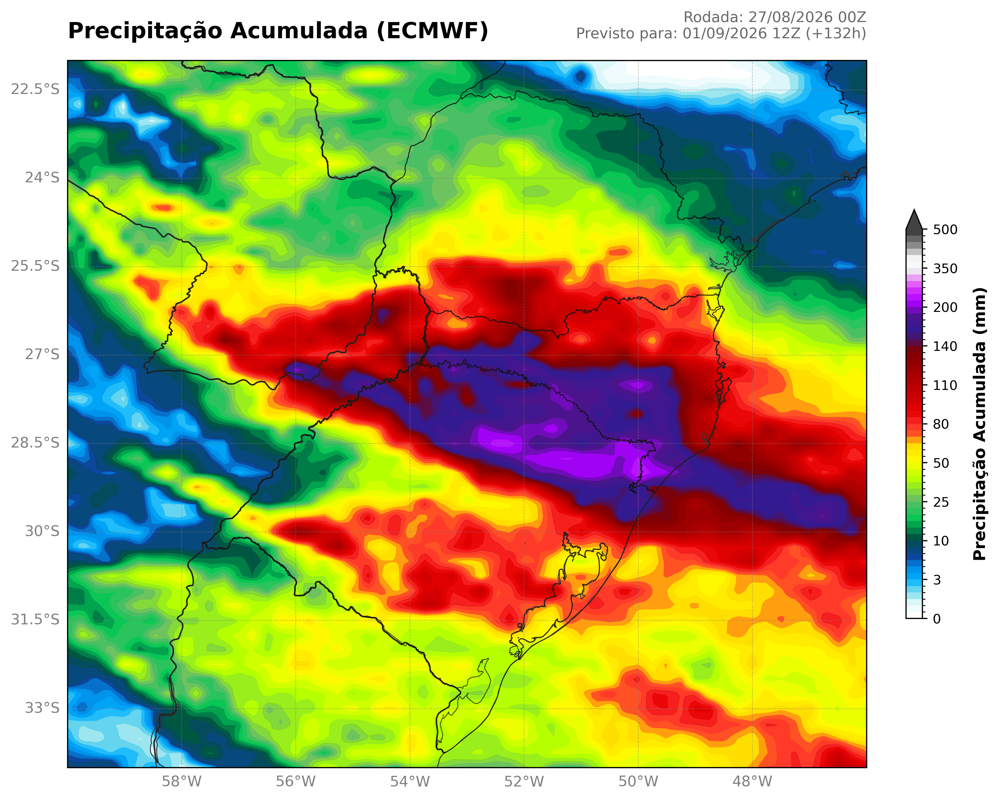

In [ ]:
import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects

# ============================================================
# CONFIGURAÇÕES E DADOS
# ============================================================
data_rodada = '20260827'
rodada = '00'
ano_prev, mes_prev, dia_prev, hora_prev = 2026, 9, 1, 12

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)
forecast_hour = round(forecast_hour / 3) * 3 if forecast_hour <= 144 else round(forecast_hour / 6) * 6

arquivo = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo}'

if not os.path.exists(arquivo):
    print("Baixando dados do ECMWF...")
    r = requests.get(url)
    with open(arquivo, 'wb') as f: f.write(r.content)

ds = xr.open_dataset(arquivo, engine='cfgrib', backend_kwargs={'filter_by_keys': {'shortName': 'tp'}})
precip_data = ds['tp'].sel(longitude=slice(-60, -46), latitude=slice(-22, -34)) * 1000

# ============================================================
# INTERPOLAÇÃO
# ============================================================
lon_fine = np.linspace(precip_data.longitude.min().item(), precip_data.longitude.max().item(), 200)
lat_fine = np.linspace(precip_data.latitude.min().item(), precip_data.latitude.max().item(), 200)
precip_interpolated = precip_data.interp(longitude=lon_fine, latitude=lat_fine, method='linear').fillna(0)

# ============================================================
# ============================================================
# ESCALA E ESTILIZAÇÃO
# ============================================================

base_levels = [
    0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 40, 50, 60, 70, 80,
    90, 100, 110, 120, 130, 140, 150, 175, 200, 250, 300, 350, 400, 450, 500
]

# Cores
# Laranja reduzido: transição mais rápida do amarelo para o vermelho
colors = [
    '#FFFFFF', '#E0F7FA', '#80DEEA', '#00B0FF', '#0091EA', '#0D47A1',
    '#004D40', '#00C853', '#66BB6A', '#AAFF00', '#FFFF00',
    '#FFD600', '#FF5722', '#FF2C2C', '#E60000',
    '#CC0000', '#B30000', '#990000', '#7F0000',
    '#311B92', '#4A148C', '#AA00FF', '#E040FB',
    '#EEEEEE', '#FFFFFF', '#9E9E9E', '#424242'
]

# Posições personalizadas das cores
# O laranja fica concentrado em uma faixa pequena
positions = [
    0.00, 0.03, 0.06, 0.09, 0.12, 0.15,
    0.20, 0.25, 0.30, 0.35, 0.40,
    0.45,
    0.47,   # laranja
    0.50,   # vermelho começa rapidamente
    0.53, 0.57, 0.61, 0.65, 0.69,
    0.74, 0.78, 0.82, 0.86,
    0.90, 0.93, 0.96, 1.00
]

cmap_continuous = mcolors.LinearSegmentedColormap.from_list(
    'precip_vibrant_smooth',
    list(zip(positions, colors)),
    N=256
)

# ============================================================
# SUAVIZAÇÃO DOS INTERVALOS
# ============================================================

smooth_levels = []

for i in range(len(base_levels) - 1):
    smooth_levels.extend(
        np.linspace(
            base_levels[i],
            base_levels[i + 1],
            2,
            endpoint=False
        )
    )

smooth_levels.append(base_levels[-1])
smooth_levels = np.array(smooth_levels)

# ============================================================
# COLORMAP FINAL
# ============================================================

cmap = mcolors.LinearSegmentedColormap.from_list(
    'precip_final',
    cmap_continuous(
        np.linspace(0, 1, len(smooth_levels) - 1)
    ),
    N=len(smooth_levels) - 1
)

# ============================================================
# NORMALIZAÇÃO
# ============================================================

norm = mcolors.BoundaryNorm(
    smooth_levels,
    cmap.N
)

# ============================================================
# PLOT
# ============================================================
fig = plt.figure(figsize=(12, 10), facecolor='white',dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-60, -46, -34, -22], crs=ccrs.PlateCarree())

# Plot principal
cf = ax.contourf(precip_interpolated.longitude, precip_interpolated.latitude, precip_interpolated.values,
                 levels=smooth_levels, cmap=cmap, norm=norm, extend='max', antialiased=False)

# Contornos internos sutis
ax.contour(precip_interpolated.longitude, precip_interpolated.latitude, precip_interpolated.values,
           levels=base_levels[::5], colors='black', linewidths=0.2, alpha=0.2)

# Recursos cartográficos
ax.add_feature(cfeature.COASTLINE, linewidth=0.6, edgecolor='#333333')
ax.add_feature(cfeature.BORDERS, linewidth=1.0, edgecolor='#222222')

# Linhas de Grade
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=0.4, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10, 'color': 'gray'}
gl.ylabel_style = {'size': 10, 'color': 'gray'}

# Estados do Brasil (Sigla SC movida um pouco para cima)
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='#111111', linewidth=0.6, alpha=0.7, transform=ccrs.PlateCarree())

    for _, row in br_states.iterrows():
        if row['sigla'] in ['PR', 'SC', 'RS']:
            centroid = row['geometry'].representative_point()
            lon_txt, lat_txt = centroid.x, centroid.y

            # Move apenas a sigla "SC" ligeiramente para cima para não bater em Lages
            if row['sigla'] == 'SC':
                lat_txt += 0.4

except:
    pass

# ============================================================
# COLORBAR E TÍTULO
# ============================================================
cbar = plt.colorbar(cf, ax=ax, shrink=0.5, pad=0.04, ticks=base_levels[::3], aspect=25)
cbar.set_label('Precipitação Acumulada (mm)', fontsize=11, fontweight='semibold', labelpad=10)
cbar.ax.tick_params(labelsize=9)

plt.title('Precipitação Acumulada (ECMWF)', fontsize=15, fontweight='bold', pad=15, loc='left')
plt.title(f'Rodada: {rodada_dt.strftime("%d/%m/%Y %H")}Z\nPrevisto para: {prev_dt.strftime("%d/%m/%Y %H")}Z (+{forecast_hour}h)',
          fontsize=10, color='dimgray', loc='right', pad=15)

plt.savefig("precipitacao_sul_ajuste_final.png", dpi=400, bbox_inches="tight", facecolor="white")
plt.show()

In [ ]:
!pip install --upgrade cdsapi

In [ ]:
%%writefile ~/.cdsapirc
url: https://cds.climate.copernicus.eu/api
key: 55217adf-5d27-4af6-bf17-297656871944


Writing /root/.cdsapirc


Forecast: +180h

=== Processando Climatologia ERA5 ===
Calculando a média climatológica (1991-2020)...


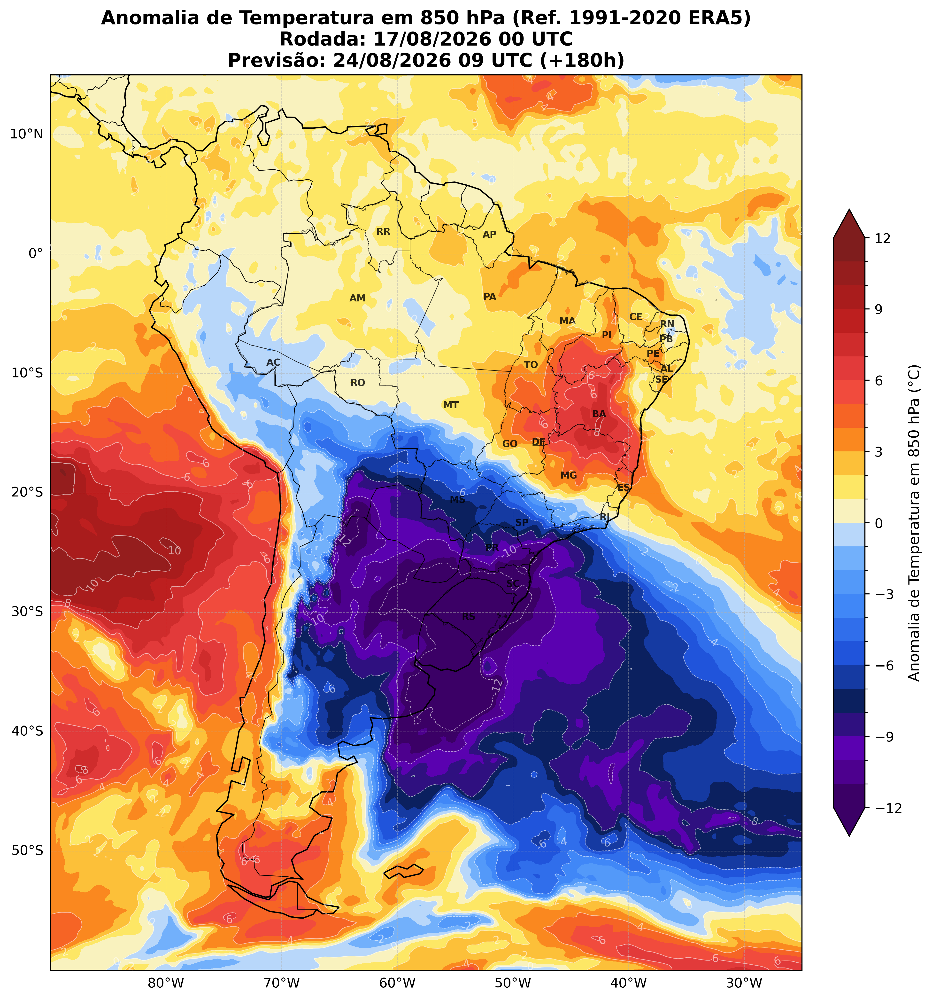

In [ ]:
# ============================================================
# ECMWF vs ERA5 - ANOMALIA DE TEMPERATURA 850 hPa
# AMÉRICA DO SUL + LIMITES E SIGLAS DOS ESTADOS DO BRASIL
# CLIMATOLOGIA REAL DE REFERÊNCIA (1991-2020)
# ============================================================

import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cdsapi

from datetime import datetime, timedelta
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import BoundaryNorm

# ============================================================
# 1. CONFIGURAÇÕES DA PREVISÃO (ECMWF)
# ============================================================
data_rodada = '20260817'
rodada = '00'

ano_prev = 2026
mes_prev = 8
dia_prev = 24
hora_prev = 9

# ============================================================
# CALCULAR FH
# ============================================================
rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)

if forecast_hour <= 144:
    forecast_hour = round(forecast_hour / 3) * 3
else:
    forecast_hour = round(forecast_hour / 6) * 6

print(f'Forecast: +{forecast_hour}h')

# FORMATAR DATAS
rodada_str = rodada_dt.strftime('%d/%m/%Y %H UTC')
prev_str = prev_dt.strftime('%d/%m/%Y %H UTC')

# ============================================================
# 2. CONFIGURAÇÃO DA CLIMATOLOGIA (ERA5)
# ============================================================
mes_clima = f'{prev_dt.month:02d}'
dia_clima = f'{prev_dt.day:02d}'
horario_clima = f'{prev_dt.hour:02d}:00'
nivel_hpa = '850'

anos_climatologia = [str(a) for a in range(1991, 2021)] # Período OMM

pasta_clima = './climatologia_era5'
if not os.path.exists(pasta_clima):
    os.makedirs(pasta_clima)

# ============================================================
# DOWNLOAD ROBUSTO ECMWF
# ============================================================
arquivo_ecmwf = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
base_url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/'
url = base_url + arquivo_ecmwf

baixar = False
if not os.path.exists(arquivo_ecmwf):
    baixar = True
elif os.path.getsize(arquivo_ecmwf) < 100000:
    print('Arquivo corrompido detectado. Removendo...')
    os.remove(arquivo_ecmwf)
    baixar = True

if baixar:
    print('Baixando ECMWF...')
    r = requests.get(url, timeout=60)
    if r.status_code != 200:
        raise Exception(f'Erro download ECMWF: {r.status_code}')
    with open(arquivo_ecmwf, 'wb') as f:
        f.write(r.content)
    print(f'Arquivo salvo: {arquivo_ecmwf} ({os.path.getsize(arquivo_ecmwf)/1e6:.1f} MB)')

# ============================================================
# FUNÇÃO PARA DOWNLOAD DO ERA5
# ============================================================
def baixar_era5_clima(filename, ano, mes, day, hora):
    caminho_arquivo = os.path.join(pasta_clima, filename)
    if os.path.exists(caminho_arquivo) and os.path.getsize(caminho_arquivo) < 10000:
        os.remove(caminho_arquivo)

    if not os.path.exists(caminho_arquivo):
        print(f"Baixando ERA5 para o ano {ano}...")
        try:
            c = cdsapi.Client()
            c.retrieve(
                'reanalysis-era5-pressure-levels',
                {
                    'product_type': 'reanalysis',
                    'variable': ['temperature'],
                    'pressure_level': [nivel_hpa],
                    'year': [ano],
                    'month': [mes],
                    'day': [day],
                    'time': [hora],
                    'format': 'netcdf'
                },
                caminho_arquivo
            )
        except Exception as e:
            print(f"Erro ao baixar ano {ano}: {e}.")
            return None
    return caminho_arquivo

# ============================================================
# 3. PROCESSAR CLIMATOLOGIA ERA5 + CORREÇÃO GEOGRÁFICA
# ============================================================
print(f"\n=== Processando Climatologia ERA5 ===")
t_clima_lista = []

for ano in anos_climatologia:
    nome_netcdf = f'era5_t850_{ano}{mes_clima}{dia_clima}_{prev_dt.hour:02d}z.nc'
    caminho_nc = baixar_era5_clima(nome_netcdf, ano, mes_clima, dia_clima, horario_clima)

    if caminho_nc and os.path.exists(caminho_nc):
        ds_ano = xr.open_dataset(caminho_nc)
        # Correção da longitude 0/360 para -180/180
        ds_ano = ds_ano.assign_coords(longitude=(((ds_ano.longitude + 180) % 360) - 180))
        ds_ano = ds_ano.sortby('longitude')

        t_ano = ds_ano['t'].squeeze() - 273.15
        t_clima_lista.append(t_ano)

if len(t_clima_lista) == 0:
    raise Exception("Nenhum dado de climatologia foi carregado. Verifique sua chave da API do CDS.")

print("Calculando a média climatológica (1991-2020)...")
t_clima_media = xr.concat(t_clima_lista, dim='year').mean(dim='year')

# ============================================================
# 4. ABRIR E PROCESSAR PREVISÃO DO ECMWF
# ============================================================
try:
    ds_ecmwf = xr.open_dataset(
        arquivo_ecmwf,
        engine='cfgrib',
        backend_kwargs={'filter_by_keys': {'typeOfLevel': 'isobaricInhPa', 'level': int(nivel_hpa), 'shortName': 't'}}
    )
except Exception as e:
    if os.path.exists(arquivo_ecmwf): os.remove(arquivo_ecmwf)
    raise

t850_ecmwf = ds_ecmwf['t'] - 273.15

# Recorte geográfico preliminar para otimizar interpolação
t850_ecmwf = t850_ecmwf.sel(longitude=slice(-95, -25), latitude=slice(15, -60))
t_clima_media = t_clima_media.sel(longitude=slice(-95, -25), latitude=slice(15, -60))

# Interpolar ECMWF para bater exatamente com os pontos de grade do ERA5
t850_ecmwf_interp = t850_ecmwf.interp(latitude=t_clima_media.latitude, longitude=t_clima_media.longitude)

# ============================================================
# 5. CÁLCULO DA ANOMALIA E SUAVIZAÇÃO
# ============================================================
anomalia = t850_ecmwf_interp - t_clima_media

lats = anomalia.latitude.values
lons = anomalia.longitude.values
anomalia_suave = gaussian_filter(anomalia.values, sigma=0.6)

# ============================================================
# ESCALA DE CORES PARA ANOMALIA
# ============================================================
levels = np.arange(-12, 13, 1)

colors_anomalia = [
    (-12, '#3B0066'), (-10, '#5D00B3'), (-8,  '#0A1D56'),
    (-6,  '#1D4ED8'), (-4,  '#3B82F6'), (-2,  '#60A5FA'),
    (-1,  '#93C5FD'), (0,   '#F3F4F6'), (1,   '#FEF08A'),
    (2,   '#FDE047'), (4,   '#F97316'), (6,   '#EF4444'),
    (9,   '#B91C1C'), (12,  '#7F1D1D')
]
temps, cols = zip(*colors_anomalia)
pos = [(t - levels.min()) / (levels.max() - levels.min()) for t in temps]
cmap_anom = LinearSegmentedColormap.from_list('anom_temp', list(zip(pos, cols)))
norm_anom = BoundaryNorm(levels, cmap_anom.N)

# ============================================================
# FIGURA E MAPA VISUAL
# ============================================================
fig = plt.figure(figsize=(14, 12),dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-90, -25, -60, 15], crs=ccrs.PlateCarree())

# Plot do preenchimento da anomalia
cf = ax.contourf(
    lons, lats, anomalia_suave,
    levels=levels, cmap=cmap_anom, norm=norm_anom,
    extend='both', transform=ccrs.PlateCarree()
)

# Isolinhas brancas discretas da Anomalia
cs = ax.contour(
    lons, lats, anomalia_suave,
    levels=np.arange(-12, 13, 2), colors='white',
    linewidths=0.45, alpha=0.6, transform=ccrs.PlateCarree()
)
ax.clabel(cs, fmt='%d', fontsize=8, inline=True)

# Linhas de Base
ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.15)
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

# ============================================================
# LIMITES E SIGLAS DOS ESTADOS DO BRASIL
# ============================================================
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)

    # Desenhar contorno dos estados
    br_states.geometry.boundary.plot(
        ax=ax, color='black', linewidth=0.4, alpha=0.6, transform=ccrs.PlateCarree()
    )

    # Escrever siglas pequenas no centroide representativo
    for _, row in br_states.iterrows():
        centroid = row['geometry'].representative_point()
        sigla = row['sigla']

        ax.text(
            centroid.x, centroid.y, sigla,
            fontsize=7, fontweight='bold', color='black', alpha=0.8,
            ha='center', va='center', transform=ccrs.PlateCarree()
        )
except Exception as e:
    print(f"Aviso: Não foi possível plotar os estados brasileiros. Erro: {e}")

# GRID
gl = ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# COLORBAR
cbar = plt.colorbar(cf, ax=ax, shrink=0.7, pad=0.03)
cbar.set_label('Anomalia de Temperatura em 850 hPa (°C)', fontsize=11)

# TÍTULO
ax.set_title(
    f'Anomalia de Temperatura em 850 hPa (Ref. 1991-2020 ERA5)\n'
    f'Rodada: {rodada_str}\n'
    f'Previsão: {prev_str} (+{forecast_hour}h)',
    fontsize=14, fontweight='bold'
)

plt.show()

Forecast: +42h

=== Processando Climatologia ERA5 2m ===
Ano 1991 já encontrado localmente (Download pulado).
Ano 1992 já encontrado localmente (Download pulado).
Ano 1993 já encontrado localmente (Download pulado).
Ano 1994 já encontrado localmente (Download pulado).
Ano 1995 já encontrado localmente (Download pulado).
Ano 1996 já encontrado localmente (Download pulado).
Ano 1997 já encontrado localmente (Download pulado).
Ano 1998 já encontrado localmente (Download pulado).
Ano 1999 já encontrado localmente (Download pulado).
Ano 2000 já encontrado localmente (Download pulado).
Ano 2001 já encontrado localmente (Download pulado).
Ano 2002 já encontrado localmente (Download pulado).
Ano 2003 já encontrado localmente (Download pulado).
Ano 2004 já encontrado localmente (Download pulado).
Ano 2005 já encontrado localmente (Download pulado).
Ano 2006 já encontrado localmente (Download pulado).
Ano 2007 já encontrado localmente (Download pulado).
Ano 2008 já encontrado localmente (Downloa

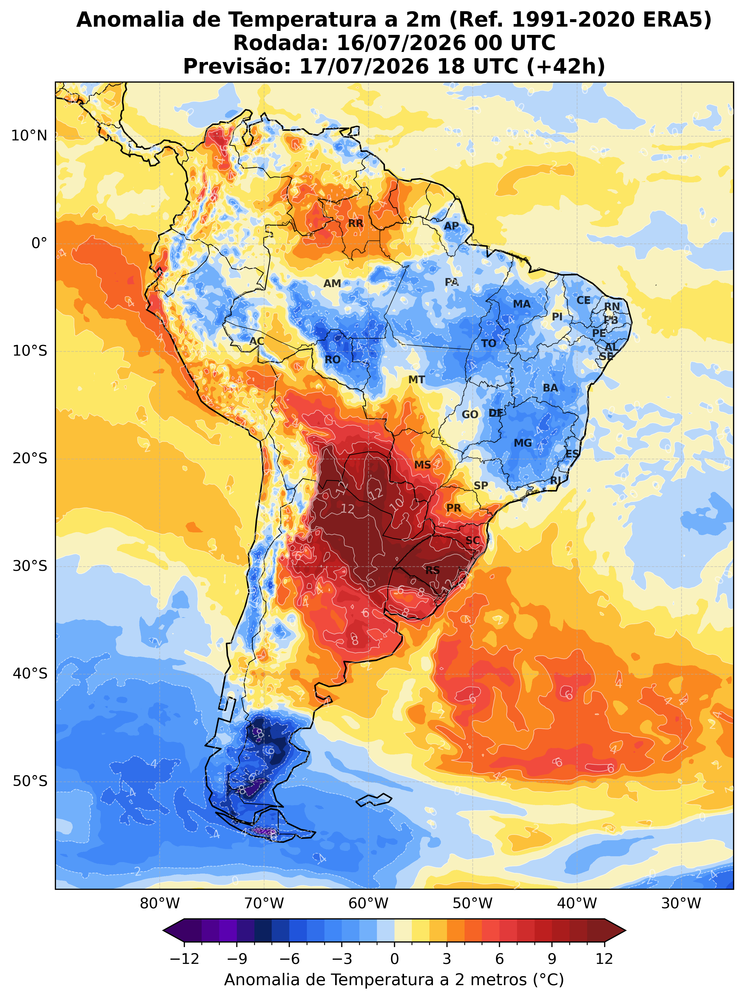

In [ ]:
# ============================================================
# ECMWF vs ERA5 - ANOMALIA DE TEMPERATURA A 2 METROS
# AMÉRICA DO SUL + LIMITES E SIGLAS DOS ESTADOS DO BRASIL
# CLIMATOLOGIA REAL DE REFERÊNCIA (1991-2020)
# ============================================================

import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cdsapi

from datetime import datetime, timedelta
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import BoundaryNorm

# ============================================================
# 1. CONFIGURAÇÕES DA PREVISÃO (ECMWF)
# ============================================================
data_rodada = '20260716'
rodada = '00'

ano_prev = 2026
mes_prev = 7
dia_prev = 17
hora_prev = 18

# ============================================================
# CALCULAR FH
# ============================================================
rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)

if forecast_hour <= 144:
    forecast_hour = round(forecast_hour / 3) * 3
else:
    forecast_hour = round(forecast_hour / 6) * 6

print(f'Forecast: +{forecast_hour}h')

# FORMATAR DATAS
rodada_str = rodada_dt.strftime('%d/%m/%Y %H UTC')
prev_str = prev_dt.strftime('%d/%m/%Y %H UTC')

# ============================================================
# 2. CONFIGURAÇÃO DA CLIMATOLOGIA (ERA5)
# ============================================================
mes_clima = f'{prev_dt.month:02d}'
dia_clima = f'{prev_dt.day:02d}'
horario_clima = f'{prev_dt.hour:02d}:00'

anos_climatologia = [str(a) for a in range(1991, 2021)] # Período OMM

pasta_clima = './climatologia_era5_2m'
if not os.path.exists(pasta_clima):
    os.makedirs(pasta_clima)

# ============================================================
# DOWNLOAD ROBUSTO ECMWF
# ============================================================
arquivo_ecmwf = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
base_url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/'
url = base_url + arquivo_ecmwf

baixar = False
if not os.path.exists(arquivo_ecmwf):
    baixar = True
elif os.path.getsize(arquivo_ecmwf) < 100000:
    print('Arquivo corrompido detectado. Removendo...')
    os.remove(arquivo_ecmwf)
    baixar = True

if baixar:
    print('Baixando ECMWF...')
    r = requests.get(url, timeout=60)
    if r.status_code != 200:
        raise Exception(f'Erro download ECMWF: {r.status_code}')
    with open(arquivo_ecmwf, 'wb') as f:
        f.write(r.content)
    print(f'Arquivo salvo: {arquivo_ecmwf} ({os.path.getsize(arquivo_ecmwf)/1e6:.1f} MB)')

# ============================================================
# FUNÇÃO PARA DOWNLOAD DO ERA5 (SINGLE LEVELS - 2M)
# ============================================================
def baixar_era5_clima(filename, ano, mes, day, hora):
    caminho_arquivo = os.path.join(pasta_clima, filename)
    if os.path.exists(caminho_arquivo) and os.path.getsize(caminho_arquivo) < 10000:
        os.remove(caminho_arquivo)

    if not os.path.exists(caminho_arquivo):
        print(f"Baixando ERA5 2m para o ano {ano}...")
        try:
            c = cdsapi.Client()
            c.retrieve(
                'reanalysis-era5-single-levels', # Alterado para Single Levels
                {
                    'product_type': 'reanalysis',
                    'variable': ['2m_temperature'], # Alterado para temperatura a 2 metros
                    'year': [ano],
                    'month': [mes],
                    'day': [day],
                    'time': [hora],
                    'format': 'netcdf'
                },
                caminho_arquivo
            )
        except Exception as e:
            print(f"Erro ao baixar ano {ano}: {e}.")
            return None
    else:
        print(f"Ano {ano} já encontrado localmente (Download pulado).")
    return caminho_arquivo

# ============================================================
# 3. PROCESSAR CLIMATOLOGIA ERA5 + CORREÇÃO GEOGRÁFICA
# ============================================================
print(f"\n=== Processando Climatologia ERA5 2m ===")
t_clima_lista = []

for ano in anos_climatologia:
    nome_netcdf = f'era5_t2m_{ano}{mes_clima}{dia_clima}_{prev_dt.hour:02d}z.nc'
    caminho_nc = baixar_era5_clima(nome_netcdf, ano, mes_clima, dia_clima, horario_clima)

    if caminho_nc and os.path.exists(caminho_nc):
        ds_ano = xr.open_dataset(caminho_nc)
        # Correção da longitude 0/360 para -180/180
        ds_ano = ds_ano.assign_coords(longitude=(((ds_ano.longitude + 180) % 360) - 180))
        ds_ano = ds_ano.sortby('longitude')

        # Mapeamento dinâmico da chave de temperatura do ERA5
        if 't2m' in ds_ano:
            t_var = ds_ano['t2m']
        elif '2t' in ds_ano:
            t_var = ds_ano['2t']
        elif 't' in ds_ano:
            t_var = ds_ano['t']
        else:
            raise KeyError(f"Variável de temperatura não mapeada no arquivo ERA5 de {ano}. Chaves: {list(ds_ano.keys())}")

        t_ano = t_var.squeeze() - 273.15
        t_clima_lista.append(t_ano)

if len(t_clima_lista) == 0:
    raise Exception("Nenhum dado de climatologia foi carregado. Verifique sua chave da API do CDS.")

print("Calculando a média climatológica (1991-2020)...")
t_clima_media = xr.concat(t_clima_lista, dim='year').mean(dim='year')

# ============================================================
# 4. ABRIR E PROCESSAR PREVISÃO DO ECMWF (2 METROS)
# ============================================================
try:
    ds_ecmwf = xr.open_dataset(
        arquivo_ecmwf,
        engine='cfgrib',
        backend_kwargs={'filter_by_keys': {'typeOfLevel': 'heightAboveGround', 'level': 2, 'shortName': '2t'}}
    )
except Exception as e:
    if os.path.exists(arquivo_ecmwf): os.remove(arquivo_ecmwf)
    raise

# Mapeamento dinâmico da chave de temperatura do ECMWF GRIB
if '2t' in ds_ecmwf:
    t2m_ecmwf = ds_ecmwf['2t'] - 273.15
elif 't2m' in ds_ecmwf:
    t2m_ecmwf = ds_ecmwf['t2m'] - 273.15
elif 't' in ds_ecmwf:
    t2m_ecmwf = ds_ecmwf['t'] - 273.15
else:
    raise KeyError(f"Variável de temperatura não encontrada no ECMWF GRIB. Chaves: {list(ds_ecmwf.keys())}")

# Recorte geográfico preliminar para otimizar interpolação
t2m_ecmwf = t2m_ecmwf.sel(longitude=slice(-95, -25), latitude=slice(15, -60))
t_clima_media = t_clima_media.sel(longitude=slice(-95, -25), latitude=slice(15, -60))

# Interpolar ECMWF para bater exatamente com os pontos de grade do ERA5
t2m_ecmwf_interp = t2m_ecmwf.interp(latitude=t_clima_media.latitude, longitude=t_clima_media.longitude)

# ============================================================
# 5. CÁLCULO DA ANOMALIA E SUAVIZAÇÃO
# ============================================================
anomalia = t2m_ecmwf_interp - t_clima_media

lats = anomalia.latitude.values
lons = anomalia.longitude.values
anomalia_suave = gaussian_filter(anomalia.values, sigma=0.6)

# ============================================================
# ESCALA DE CORES PARA ANOMALIA
# ============================================================
levels = np.arange(-12, 13, 1)

colors_anomalia = [
    (-12, '#3B0066'), (-10, '#5D00B3'), (-8,  '#0A1D56'),
    (-6,  '#1D4ED8'), (-4,  '#3B82F6'), (-2,  '#60A5FA'),
    (-1,  '#93C5FD'), (0,   '#F3F4F6'), (1,   '#FEF08A'),
    (2,   '#FDE047'), (4,   '#F97316'), (6,   '#EF4444'),
    (9,   '#B91C1C'), (12,  '#7F1D1D')
]
temps, cols = zip(*colors_anomalia)
pos = [(t - levels.min()) / (levels.max() - levels.min()) for t in temps]
cmap_anom = LinearSegmentedColormap.from_list('anom_temp', list(zip(pos, cols)))
norm_anom = BoundaryNorm(levels, cmap_anom.N)

# ============================================================
# FIGURA E MAPA VISUAL
# ============================================================
fig = plt.figure(figsize=(14, 12),dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-90, -25, -60, 15], crs=ccrs.PlateCarree())

# Plot do preenchimento da anomalia
cf = ax.contourf(
    lons, lats, anomalia_suave,
    levels=levels, cmap=cmap_anom, norm=norm_anom,
    extend='both', transform=ccrs.PlateCarree()
)

# Isolinhas brancas discretas da Anomalia
cs = ax.contour(
    lons, lats, anomalia_suave,
    levels=np.arange(-12, 13, 2), colors='white',
    linewidths=0.45, alpha=0.6, transform=ccrs.PlateCarree()
)
ax.clabel(cs, fmt='%d', fontsize=8, inline=True)

# Linhas de Base
ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.15)
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.add_feature(cfeature.COASTLINE, linewidth=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

# ============================================================
# LIMITES E SIGLAS DOS ESTADOS DO BRASIL
# ============================================================
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)

    # Desenhar contorno dos estados
    br_states.geometry.boundary.plot(
        ax=ax, color='black', linewidth=0.4, alpha=0.6, transform=ccrs.PlateCarree()
    )

    # Escrever siglas pequenas no centroide representativo
    for _, row in br_states.iterrows():
        centroid = row['geometry'].representative_point()
        sigla = row['sigla']

        ax.text(
            centroid.x, centroid.y, sigla,
            fontsize=7, fontweight='bold', color='black', alpha=0.8,
            ha='center', va='center', transform=ccrs.PlateCarree()
        )
except Exception as e:
    print(f"Aviso: Não foi possível plotar os estados brasileiros. Erro: {e}")

# GRID
gl = ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# COLORBAR
cbar = plt.colorbar(cf, ax=ax, shrink=0.4, pad=0.03, orientation='horizontal')
cbar.set_label('Anomalia de Temperatura a 2 metros (°C)', fontsize=11)

# TÍTULO
ax.set_title(
    f'Anomalia de Temperatura a 2m (Ref. 1991-2020 ERA5)\n'
    f'Rodada: {rodada_str}\n'
    f'Previsão: {prev_str} (+{forecast_hour}h)',
    fontsize=14, fontweight='bold'
)
plt.savefig('anom_temperatura_ecmwf.png', dpi=400, bbox_inches='tight')
plt.show()

Baixando: 20260903000000-102h-oper-fc.grib2...


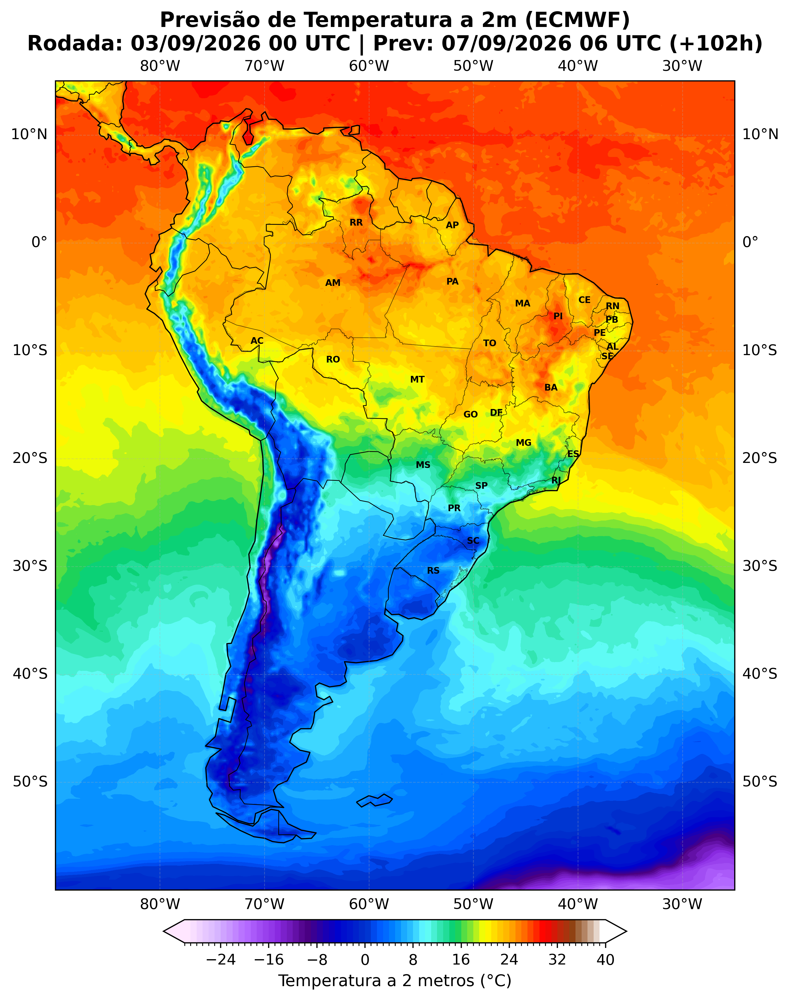

In [ ]:
# ============================================================
# ECMWF - TEMPERATURA A 2 METROS
# ============================================================

import os
import requests
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from datetime import datetime
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm

# ============================================================
# 1. CONFIGURAÇÕES DA PREVISÃO
# ============================================================
data_rodada = '20260903'
rodada = '00'
ano_prev = 2026
mes_prev = 9
dia_prev = 7
hora_prev = 6

rodada_dt = datetime.strptime(f'{data_rodada} {rodada}', '%Y%m%d %H')
prev_dt = datetime(ano_prev, mes_prev, dia_prev, hora_prev)
forecast_hour = int((prev_dt - rodada_dt).total_seconds() / 3600)

if forecast_hour <= 144: forecast_hour = round(forecast_hour / 3) * 3
else: forecast_hour = round(forecast_hour / 6) * 6

rodada_str = rodada_dt.strftime('%d/%m/%Y %H UTC')
prev_str = prev_dt.strftime('%d/%m/%Y %H UTC')

# ============================================================
# 2. DOWNLOAD DO DADO
# ============================================================
arquivo_ecmwf = f'{data_rodada}{rodada}0000-{forecast_hour}h-oper-fc.grib2'
if not os.path.exists(arquivo_ecmwf):
    url = f'https://data.ecmwf.int/forecasts/{data_rodada}/{rodada}z/ifs/0p25/oper/{arquivo_ecmwf}'
    print(f'Baixando: {arquivo_ecmwf}...')
    r = requests.get(url, timeout=60)
    with open(arquivo_ecmwf, 'wb') as f: f.write(r.content)

# ============================================================
# 3. PROCESSAMENTO (CARGA E SUAVIZAÇÃO)
# ============================================================
ds_ecmwf = xr.open_dataset(
    arquivo_ecmwf,
    engine='cfgrib',
    backend_kwargs={'filter_by_keys': {'shortName': '2t', 'level': 2}}
)

t2m_data = (ds_ecmwf['t2m'] - 273.15).squeeze()
t2m_data = t2m_data.sel(longitude=slice(-95, -25), latitude=slice(15, -60))

t2m_suave = gaussian_filter(t2m_data.values, sigma=0.4)
lats, lons = t2m_data.latitude.values, t2m_data.longitude.values

# ============================================================
# 4. CONFIGURAÇÃO DA ESCALA PERSONALIZADA
# ============================================================
levels = np.arange(-30, 41, 1)
colors_temp = [
    (-30, '#FFE6FF'), (-25, '#D6B3FF'), (-20, '#B266FF'), (-15, '#8A2BE2'),
    (-10, '#4B0082'), (-5, '#0000CD'), (0, '#0033CC'), (2, '#0055FF'),
    (5, '#0088FF'), (8, '#33CCFF'), (10, '#66FFFF'), (15, '#00CC66'),
    (20, '#FFFF00'), (25, '#FF9900'), (30, '#FF0000'), (35, '#8B4513'), (40, '#FFFFFF')
]

temps, cols = zip(*colors_temp)
pos = [(t - levels.min()) / (levels.max() - levels.min()) for t in temps]
cmap_temp = LinearSegmentedColormap.from_list('temp2m', list(zip(pos, cols)))
norm_temp = BoundaryNorm(levels, cmap_temp.N)

# ============================================================
# 5. FIGURA E MAPA
# ============================================================
fig = plt.figure(figsize=(14, 12),dpi=400)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([-90, -25, -60, 15], crs=ccrs.PlateCarree())

cf = ax.contourf(
    lons, lats, t2m_suave,
    levels=levels, cmap=cmap_temp, norm=norm_temp,
    extend='both', transform=ccrs.PlateCarree()
)

# Features
ax.add_feature(cfeature.LAND, facecolor='lightgray', alpha=0.1)
ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)

# Estados do Brasil
try:
    url_br = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
    br_states = gpd.read_file(url_br)
    br_states.geometry.boundary.plot(ax=ax, color='black', linewidth=0.3, alpha=0.5, transform=ccrs.PlateCarree())
    for _, row in br_states.iterrows():
        centroid = row['geometry'].representative_point()
        ax.text(centroid.x, centroid.y, row['sigla'], fontsize=6, fontweight='bold', ha='center', va='center', transform=ccrs.PlateCarree())
except: pass

# Grid e Legenda
gl = ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', alpha=0.3)
cbar = plt.colorbar(cf, ax=ax, shrink=0.4, pad=0.03, orientation='horizontal')
cbar.set_label('Temperatura a 2 metros (°C)', fontsize=11)

ax.set_title(f'Previsão de Temperatura a 2m (ECMWF)\nRodada: {rodada_str} | Prev: {prev_str} (+{forecast_hour}h)', fontsize=14, fontweight='bold')
plt.savefig('temperatura_ecmwf.png', dpi=400, bbox_inches='tight')
plt.show()